In [1]:
from HeaderP import *
import pynbody as pb
import pynbody.filt as filt
import os, pickle, glob


In [2]:
sims = os.listdir('./')
sims = [i for i in sims if 'x' in i]
sims = [i for i in sims if '.txt' not in i]
sims = [i for i in sims if '.pkl' not in i]
simsnames = [i.split('_')[0][1:] for i in sims]



In [13]:
from itertools import combinations_with_replacement
import matplotlib
from scipy import interpolate
from scipy.interpolate import interp1d
import matplotlib as mpl
def getcolor(vrange,cm=plt.cm.get_cmap('viridis')):
    cmap = cm
    norm = matplotlib.colors.Normalize(vmin=min(vrange[:-1]), vmax=max(vrange[:-1]))
    return [cmap(norm(i)) for i in vrange]



# get true slope
def getISMevolution(ISMdata, numofbins=15):
    agebin = np.linspace(min(ISMdata['time']),max(ISMdata['time']),numofbins+1)
    slopes_ism = np.zeros(len(agebin)-1)
    splitR = np.linspace(0,10,6)
    ismcols = ISMdata.columns[1:]
    strres = np.zeros(len(agebin)-1)
    for i in range(len(agebin)-1):
        feh_ism=np.zeros(len(splitR)-1)
        for j in range(len(splitR)-1):
            m = ((ISMdata['time']>agebin[i])&(ISMdata['time']<agebin[i+1]))
            feh_ism[j] = np.mean(ISMdata[ismcols[j]][m].dropna())
        z, strres[i] = np.polyfit(splitR[:-1]+np.diff(splitR)[0], feh_ism, 1, full=True)[:2]
        p = np.poly1d(z)
        slopes_ism[i]=p[1]

    f_slope = interpolate.interp1d((agebin[:-1]+np.diff(agebin)[0]/2),slopes_ism, kind='cubic')
    f_feh = interpolate.interp1d(ISMdata['time'],ISMdata[ismcols[-2]])
    return agebin[:-1]+np.diff(agebin)[0]/2, f_slope, f_feh, strres




def readsimdata(simNo,Rcut,Rcut_thread,zcut_thread,disk=True):
    if disk:
        data=pd.read_pickle('./'+simNo+'_z_0_decomp.pkl')
    else:
        data=pd.read_pickle('./'+simNo+'_z_0.pkl')
    data['R']=np.sqrt((data['x'])**2+data['y']**2)
    
    if Rcut:
        data=data.loc[data['Rbir']<Rcut_thread].reset_index(drop=True)
        data=data.loc[abs(data['zbir'])<zcut_thread].reset_index(drop=True)
    data['dR']=data['R']-data['Rbir']
    data['dz']=abs(data['z'])-abs(data['zbir'])
    return data

def calcISM(sim, splitR=np.linspace(1,15,6), disk=False):
    
    print(sim)
    simsname = sim.split('_')[0]
    allsnaps = glob.glob(sim+'/*.?????')
    
    allsnaps_time = [int(i.split('.')[-1]) for i in allsnaps if (('param' not in i) and ('draco' not in i) and ('dat_' not in i) and ('79e12' not in i.split('.')[-1]))]
    snaplookup = {int(allsnaps[i].split('.')[-1]):allsnaps[i] for i in range(len(allsnaps)) if (('param' not in allsnaps[i]) and ('draco' not in allsnaps[i]) and ('dat_' not in allsnaps[i]) and ('79e12' not in allsnaps[i].split('.')[-1]))}

    allsnaps_time = sorted(allsnaps_time)
    
    if disk:
        f = open(simsname+'_ISM_disk.txt', "w")
        f_w = open(simsname+'_weights_disk.txt', "w")
    else:
        f = open(simsname+'_ISM.txt', "w")
        f_w = open(simsname+'_weights.txt', "w")
    headerf = 'time,'
    for i in range(len(splitR)-1):
        rbin = str(splitR[i])+'-'+str(splitR[i+1])
        if i == len(splitR)-2:
             headerf = headerf+rbin+'\n'
        else:
            headerf = headerf+rbin+','
    f.write(headerf)
    f.flush()
    
    
    simNo=simsname
    Rcut=True
    Rcut_thread=30
    zcut_thread=5

    print('Reading in simulation...')
    data_z0 = readsimdata(simNo,Rcut,Rcut_thread,zcut_thread,disk=disk)
    print('Finished reading in simulation...')
    
    
    count=0
    for i in trange(len(allsnaps_time)):
        s = pb.load(snaplookup[allsnaps_time[i]])
        s.physical_units()
        ages = s.properties['time']
        h=s.halos()
        try:
            h[1]
        except:
            print("Can't find halo for snapshot "+snaplookup[allsnaps_time[i]])
            continue
        pb.analysis.angmom.faceon(h[1])

        gal = pb.filt.LowPass('r', '25 kpc') & pb.filt.BandPass('z', '-2.5 kpc', '2.5 kpc')
        sim = h[1][gal]
    
        stars = sim.g
        
        if len(stars)==0:
            print('No stars in this snapshot!')
            continue
        
        cols = ['feh','x','y']
        try:
            this_snap = {j:stars[j] for j in cols}
        except:
            print('No gas')
            continue
    
        data = pd.DataFrame(this_snap)
        data['R'] = np.sqrt(data['x']**2+data['y']**2)
        data = data.dropna(subset=['feh'])
        
        nextlinef = str(ages).split(' ')[0]
        for j in range(len(splitR)-1):
            locstar = data.loc[(data['R']>splitR[j])&(data['R']<splitR[j+1])].reset_index(drop=True)
            nextlinef = nextlinef+','+str(np.mean(locstar['feh']))
        print(nextlinef)
        f.write(nextlinef+'\n')
        f.flush()
        
        ############################ analyze stars ############################
        stars = sim.s
        cols = ['feh','x','y','iord']
        try:
            this_snap = {j:stars[j] for j in cols}
        except:
            print('No stars')
            continue
        if len(stars)<1000:
            print('Not enough stars!')
            continue
        data = pd.DataFrame(this_snap)
        data['R'] = np.sqrt(data['x']**2+data['y']**2)
        data = data.dropna(subset=['feh'])
        data = pd.merge(data, data_z0[['Rbir', 'age', 'iord']], 
                        left_on='iord', right_on='iord',how='inner')
        
        
        #print('Calculating weights...')
        try:
            allnames, weights, weights_err, y, ypred = calcRbir_cv(data)
            scat = np.std(y-ypred)
            bias  = np.mean(y-ypred)
        except:
            print("can't get weights for feh and age!")
            continue
        #print(len(allnames), len(weights))
        #print('Finished calculating weights...')
        
            
        #print('Calculating weights with R...')
        try:
            allnames_wR, weights_wR, weights_err_wR, y_wR, ypred_wR = calcRbir_cv_withR(data)
            scat_wR = np.std(y_wR-ypred_wR)
            bias_wR  = np.mean(y_wR-ypred_wR)
        except:
            print("can't get weights for feh, R, and age!")
            continue
        #print('Finished calculating weights...')

        if count==0:
            firstline = 'time'
            for kk in range(len(allnames)):
                firstline = firstline+','+allnames[kk]
                firstline = firstline+','+allnames[kk]+'_err'
                
            for kk in range(len(allnames_wR)):
                firstline = firstline+','+allnames_wR[kk]+'_wR'
                firstline = firstline+','+allnames_wR[kk]+'_wR_err'
            firstline = firstline+','+'scatter,bias,scatter_err,bias_err\n'
            
            f_w.write(firstline)
            f_w.flush()
            count=count+1
            continue
        
        linewrite = str(ages).split(' ')[0]
        for kk in range(len(allnames)):
            linewrite = linewrite+','+str(weights[kk])
            linewrite = linewrite+','+str(weights_err[kk])

        for kk in range(len(allnames_wR)):
            linewrite = linewrite+','+str(weights_wR[kk])
            linewrite = linewrite+','+str(weights_err_wR[kk])
        linewrite = linewrite+','+str(scat)+','+str(bias)+','+str(scat_wR)+','+str(bias_wR)+'\n'
        f_w.write(linewrite)
        f_w.flush() 
            

In [438]:
sim=sims[-2]
print(sim)
simsname = sim.split('_')[0]
allsnaps = glob.glob(sim+'/*.?????')

allsnaps_time = [int(i.split('.')[-1]) for i in allsnaps if (('param' not in i) and ('draco' not in i) and ('dat_' not in i) and ('79e12' not in i.split('.')[-1]))]
snaplookup = {int(allsnaps[i].split('.')[-1]):allsnaps[i] for i in range(len(allsnaps)) if (('param' not in allsnaps[i]) and ('draco' not in allsnaps[i]) and ('dat_' not in allsnaps[i]) and ('79e12' not in allsnaps[i].split('.')[-1]))}

allsnaps_time = sorted(allsnaps_time)

    
f = open(simsname+'_ISM_79.txt', "w")

headerf = 'time,79'
f.write(headerf)
f.flush()

simNo=simsname
Rcut=True
Rcut_thread=30
zcut_thread=5

print('Reading in simulation...')
data_z0 = readsimdata(simNo,Rcut,Rcut_thread,zcut_thread,disk=True)
print('Finished reading in simulation...')

allsnaps_time = sorted(allsnaps_time)
allages_ism = np.zeros(len(allsnaps_time))

for j in trange(len(allsnaps_time)):
    s = pb.load(snaplookup[allsnaps_time[j]])
    s.physical_units()
    allages_ism[j] = s.properties['time']

time2snap = {allages_ism[ii]:snaplookup[allsnaps_time[ii]] for ii in range(len(allsnaps_time))}



g2.79e12_3x6
Reading in simulation...
Finished reading in simulation...


100%|██████████| 229/229 [00:53<00:00,  4.25it/s]


In [439]:
count=0
for i in trange(len(allsnaps_time)):
    snap = snaplookup[allsnaps_time[i]]
    try:
        data = pd.read_pickle(snap+'_gas.pkl')
    except:
        print(snap)
    data = data.dropna(subset=['feh'])
    
    nextlinef = str(allages_ism[i]).split(' ')[0]
    locstar = data.loc[(data['R']>7)&(data['R']<9)].reset_index(drop=True)
    nextlinef = nextlinef+','+str(np.mean(locstar['feh']))
    #print(nextlinef)
    f.write(nextlinef+'\n')
    f.flush()

  2%|▏         | 5/229 [00:00<00:05, 40.57it/s]

g2.79e12_3x6/2.79e12.00010
0.08824420972130846,0.12336152438497487
g2.79e12_3x6/2.79e12.00020
0.15885704119003205,0.12336152438497487
g2.79e12_3x6/2.79e12.00030
0.2294698726587553,0.12336152438497487
0.3000827041274778,nan
0.3706955355962021,nan
0.4413083670649256,nan
0.4836760659461601,nan


  4%|▍         | 10/229 [00:00<00:05, 38.16it/s]

0.5119211985336493,nan
0.5825340300023734,-3.457051548299038
0.6531468614710965,-2.6232452484976125
0.7237596929398206,-2.1524250257869952
0.7802499581148,-2.384363130930771
0.794372524408544,-2.146719434448312


  7%|▋         | 17/229 [00:00<00:08, 23.70it/s]

0.8579240727303953,-2.2822832970599007
0.8649853558772681,-2.2925766021765397
0.9355981873459915,-2.093047661309545
0.9567820367866084,-2.0373143491946295


  9%|▊         | 20/229 [00:00<00:10, 19.38it/s]

1.0062110188147153,-1.8339137489714397
1.0627012839896939,-1.9620478303066524
1.0768238502834395,-1.9478290676818488
1.1474366817521633,-1.9941030104185482
1.2039269469271423,-1.8134491776484403


 11%|█         | 25/229 [00:01<00:14, 14.53it/s]

1.2180495132208864,-1.703936244097508
1.2816010615427387,-1.580080183899262
1.28866234468961,-1.5470778648540155
1.3592751761583342,-1.8014125264581717


 13%|█▎        | 29/229 [00:01<00:14, 13.88it/s]

1.366336459305206,-1.7675395971273093
1.429888007627056,-1.8265834762125812
1.465194423361418,-1.7233095828043936


 14%|█▎        | 31/229 [00:01<00:15, 12.71it/s]

1.5005008390957792,-1.6907671729618272
1.5711136705645017,-1.5054005812844478
1.5781749537113747,-1.5005239252180425


 14%|█▍        | 33/229 [00:01<00:15, 12.56it/s]

1.6417265020332252,-1.4514405187689616
1.6982167672082038,-1.568890203541648


 15%|█▌        | 35/229 [00:02<00:17, 10.81it/s]

1.712339333501948,-1.446758686467503
1.7829521649706734,-1.1853542601640574


 17%|█▋        | 38/229 [00:03<00:33,  5.76it/s]

1.8465037132925237,-1.0834419468021588
1.853564996439397,-1.0716204638811502
1.9241778279081219,-1.0175836465858237


 18%|█▊        | 42/229 [00:03<00:23,  8.10it/s]

1.994790659376848,-1.0035881792162828
2.0089132256705944,-0.9438999219259059
2.065403490845575,-0.9810067501375286
2.07952605713932,-1.0204633410868678


 19%|█▉        | 44/229 [00:04<00:47,  3.88it/s]

2.136016322314304,-1.1227554618150777
2.1925065874892877,-1.0334406059075425


 21%|██        | 48/229 [00:05<00:31,  5.80it/s]

2.206629153783034,-1.135893066563414
2.2772419852517656,-1.026880660376768
2.319609684133006,-0.9177803838061456


 22%|██▏       | 50/229 [00:05<00:25,  6.92it/s]

2.3478548167205,-0.8223101018203853
2.418467648189243,-0.7877364182309005
2.4890804796579826,-0.9607238992760833


 23%|██▎       | 52/229 [00:05<00:22,  7.71it/s]

2.5596933111267246,-0.7320294829686627
2.566754594273601,-0.7370395595445024


 24%|██▍       | 55/229 [00:05<00:24,  7.15it/s]

2.63030614259547,-0.6578987319275794
2.672673841476722,-0.6464241263379781


 25%|██▍       | 57/229 [00:06<00:27,  6.22it/s]

2.7009189740642254,-0.7382575566159275
2.771531805532779,-0.6483919282038882
2.792715654973394,-0.7083612372741166


 27%|██▋       | 61/229 [00:06<00:20,  8.34it/s]

2.8421446370014998,-0.6532664463016876
2.912757468470224,-0.5769911410035437
2.9833702999389455,-0.6302386552664189


 28%|██▊       | 63/229 [00:06<00:19,  8.65it/s]

3.0539831314076684,-0.5954747801878975
3.124595962876389,-0.5235693882581491


 28%|██▊       | 65/229 [00:07<00:19,  8.62it/s]

3.195208794345112,-0.5157927074870176
3.2658216258138326,-0.5425384177945263


 29%|██▉       | 67/229 [00:07<00:18,  8.88it/s]

3.3364344572825564,-0.5783642795090278
3.350557023576299,-0.5188231880512992


 30%|███       | 69/229 [00:07<00:20,  7.65it/s]

3.4070472887512784,-0.5469212525765568
3.4776601202199995,-0.5305741961753827


 31%|███▏      | 72/229 [00:07<00:17,  8.82it/s]

3.5200278191012333,-0.5557651839855374
3.5482729516887193,-0.5117538482426792
3.6188857831574452,-0.5009092059156071


 33%|███▎      | 75/229 [00:08<00:22,  6.85it/s]

3.6894986146261655,-0.4711482622451867
3.710682464066783,-0.4750240480998365
3.7601114460948892,-0.42829832411330016


 33%|███▎      | 76/229 [00:08<00:34,  4.46it/s]

3.8307242775636103,-0.4445936592341244


 34%|███▍      | 78/229 [00:09<00:40,  3.70it/s]

3.901337109032331,-0.37717468503515367
3.908398392179208,-0.3858442630136118
3.971949940501052,-0.3616811167627631


 36%|███▌      | 82/229 [00:10<00:21,  6.74it/s]

4.0425627719697745,-0.35215911886931894
4.113175603438501,-0.31205137404727146
4.127298169732244,-0.30823779342078533


 37%|███▋      | 84/229 [00:10<00:18,  7.73it/s]

4.183788434907221,-0.29431061768058386
4.254401266375947,-0.2569788113604129
4.325014097844664,-0.26643585667300695


 38%|███▊      | 88/229 [00:10<00:14,  9.50it/s]

4.367381796725901,-0.22250991267797554
4.395626929313389,-0.21516707898026052
4.46623976078211,-0.23290079677584258


 39%|███▉      | 90/229 [00:10<00:15,  8.90it/s]

4.536852592250832,-0.18760634299918083
4.607465423719558,-0.20247478283083006


 41%|████      | 93/229 [00:11<00:15,  8.85it/s]

4.628649273160173,-0.19726256197603315
4.678078255188274,-0.18628780708176462
4.748691086656999,-0.12044991750410766


 41%|████▏     | 95/229 [00:11<00:13,  9.74it/s]

4.819303918125721,-0.142681526937654
4.889916749594446,-0.14310664331413586
4.918161882181931,-0.11483895793277901


 42%|████▏     | 97/229 [00:11<00:13,  9.47it/s]

4.9605295810631675,-0.1302737852872144


 43%|████▎     | 98/229 [00:11<00:16,  7.79it/s]

5.03114241253189,-0.07086664045215413


 43%|████▎     | 99/229 [00:12<00:36,  3.57it/s]

5.101755244000616,-0.08984612815454078


 44%|████▍     | 101/229 [00:13<00:46,  2.76it/s]

5.172368075469336,-0.037165202082498176
5.242980906938056,-0.05729272168262132


 45%|████▌     | 104/229 [00:13<00:24,  5.12it/s]

5.313593738406785,-0.05793182787443133
5.384206569875506,-0.04178016459763907
5.454819401344229,-0.03543323451084571


 46%|████▋     | 106/229 [00:14<00:19,  6.32it/s]

5.5254322328129515,-0.036036109679197216
5.596045064281674,-0.01429832142848695


 47%|████▋     | 108/229 [00:14<00:16,  7.24it/s]

5.6666578957503955,0.03552206120345032
5.737270727219122,0.05459060966789481


 48%|████▊     | 110/229 [00:14<00:14,  7.93it/s]

5.8078835586878474,-0.01885788833550258
5.878496390156571,0.004171466194236088


 49%|████▉     | 112/229 [00:14<00:15,  7.64it/s]

5.949109221487323,0.02569492642499951
5.984415637359656,0.025021630113298683


 50%|████▉     | 114/229 [00:15<00:14,  7.74it/s]

6.019722053094021,0.04072965368067471
6.090334884562744,0.04580808714902713
6.160947716031469,0.027806712874266545


 51%|█████     | 117/229 [00:15<00:13,  8.15it/s]

6.231560547500199,0.048041883772380035
6.302173378968926,0.062037215269288404


 52%|█████▏    | 119/229 [00:15<00:13,  7.97it/s]

6.372786210437656,0.05537942991641791
6.443399041906382,0.06016075541463494


 53%|█████▎    | 121/229 [00:15<00:11,  9.10it/s]

6.514011873375102,0.07490663812681474
6.584624704843833,0.07168482620600895
6.655237536312565,0.05423765773033013


 54%|█████▍    | 124/229 [00:16<00:12,  8.22it/s]

6.725850367781291,0.06513557553276222
6.796463199250027,0.07407218174440072


 55%|█████▌    | 126/229 [00:16<00:13,  7.64it/s]

6.867076030718757,0.06858254478705299
6.937688862187496,0.08454315501189781


 56%|█████▌    | 128/229 [00:16<00:12,  8.08it/s]

7.008301693656236,0.07212368589653335
7.078914525124961,0.07771750625954323


 57%|█████▋    | 130/229 [00:16<00:10,  9.00it/s]

7.149527356593703,0.07905104610355138
7.220140188062436,0.0777388383373219
7.2907530195311825,0.08174874149733541


 58%|█████▊    | 133/229 [00:17<00:10,  9.06it/s]

7.361365850999927,0.08275696195945724
7.431978682468673,0.09119031232913802


 59%|█████▉    | 136/229 [00:17<00:09,  9.87it/s]

7.502591513937411,0.08157033337698803
7.573204345406168,0.10076524720164524
7.643817176874913,0.10376799732976771


 60%|██████    | 138/229 [00:17<00:09,  9.32it/s]

7.714430008343668,0.10662487610850775
7.78504283981243,0.11529955845374558


 61%|██████    | 139/229 [00:18<00:16,  5.40it/s]

7.855655671281184,0.1197352787524625


 62%|██████▏   | 141/229 [00:19<00:24,  3.52it/s]

7.9262685027499415,0.12997429420479367
7.996881334218712,0.13345243746139893


 62%|██████▏   | 143/229 [00:19<00:16,  5.12it/s]

8.067494165687478,0.1235926681026632
8.138106997156255,0.12631259246858897


 63%|██████▎   | 145/229 [00:19<00:14,  5.68it/s]

8.208719828625027,0.14460606434905707
8.279332660093809,0.13883050145449086
8.349945491562593,0.13709771328361647


 64%|██████▍   | 147/229 [00:20<00:17,  4.60it/s]

8.420558323031386,0.1429450449166675


 66%|██████▌   | 150/229 [00:20<00:15,  4.94it/s]

8.491171154500181,0.15407992971263632
8.561783985968983,0.15575422357514224
8.632396817437785,0.16923256370700487


 67%|██████▋   | 153/229 [00:21<00:11,  6.48it/s]

8.703009648906598,0.16679208322107542
8.773622480374167,0.1737942467112159
8.844235311842882,0.1705642663669867


 68%|██████▊   | 155/229 [00:21<00:10,  7.36it/s]

8.9148481433116,0.1618027902204489
8.98546097478033,0.17801706775159146
9.056073806249051,0.1714136205787496


 69%|██████▊   | 157/229 [00:21<00:13,  5.53it/s]

9.126686637717782,0.19393701204364708
9.197299469186499,0.19020900521190282


 69%|██████▉   | 159/229 [00:22<00:10,  6.42it/s]

9.267912300655222,0.19143047116091758
9.33852513212394,0.20362810405454662


 71%|███████   | 162/229 [00:22<00:11,  5.68it/s]

9.409137963592665,0.20002035322364087
9.479750795061394,0.20602490938042728


 72%|███████▏  | 164/229 [00:23<00:10,  6.35it/s]

9.550363626530109,0.22065126810038546
9.620976457998834,0.22793146290453373


 72%|███████▏  | 166/229 [00:23<00:09,  6.71it/s]

9.691589289467558,0.20403858943032158
9.762202120936266,0.21065537383974464


 74%|███████▍  | 169/229 [00:23<00:06,  8.91it/s]

9.832814952405,0.21429702532298608
9.903427783873722,0.21035535923377194
9.974040615342455,0.22727014901053125


 75%|███████▍  | 171/229 [00:23<00:06,  9.08it/s]

10.044653446811164,0.20282610457611788
10.115266278279881,0.21584159789492918
10.185879109748614,0.2120587082052281


 76%|███████▌  | 174/229 [00:24<00:06,  8.34it/s]

10.256491941217332,0.2041813560520785
10.327104772686067,0.1467293120812675


 77%|███████▋  | 177/229 [00:24<00:05,  9.27it/s]

10.397717604154776,0.11170049325292179
10.468330435623487,0.08510802761965432
10.538943267092218,0.06386488211066187


 78%|███████▊  | 179/229 [00:24<00:05,  8.94it/s]

10.60955609856094,0.060736063825130374
10.680168930029666,0.05939130296300102


 79%|███████▉  | 181/229 [00:24<00:05,  9.26it/s]

10.750781761498382,0.05973274609920841
10.821394592967106,0.05641064999407789


 80%|███████▉  | 183/229 [00:25<00:04, 10.44it/s]

10.89200742443584,0.04596991760495258
10.962620255904584,0.04626946635635023
11.033233087373304,0.04040560286013082


 81%|████████  | 185/229 [00:25<00:04,  9.89it/s]

11.103845918842044,0.06135686690317324
11.174458750310771,0.05982230534912186


 82%|████████▏ | 187/229 [00:25<00:04,  8.94it/s]

11.245071581779516,0.05833972871141571


 82%|████████▏ | 188/229 [00:25<00:06,  5.88it/s]

11.315684413248244,0.05751978068243128
11.386297244716976,0.06252742504511574


 83%|████████▎ | 191/229 [00:26<00:06,  6.32it/s]

11.456910076185705,0.06559583237094205
11.52752290765445,0.07418184295394686


 84%|████████▍ | 192/229 [00:26<00:05,  6.53it/s]

11.598135739123173,0.07555654540818327
11.668748570591907,0.04165775078158392


 85%|████████▍ | 194/229 [00:26<00:04,  7.59it/s]

11.739361402060647,0.04976946082049404
11.809974233529372,0.020686368338198757


 86%|████████▋ | 198/229 [00:27<00:03,  9.08it/s]

11.880587064998114,0.02891648443062961
11.951199896466857,0.017750457256192047
12.021812727935572,0.007359009724205016


 87%|████████▋ | 199/229 [00:27<00:03,  8.90it/s]

12.092425559404314,-0.004905925282894564


 88%|████████▊ | 201/229 [00:27<00:04,  6.95it/s]

12.163038390873044,0.011780534797182307
12.233651222341779,-0.00040918082991710453


 89%|████████▊ | 203/229 [00:27<00:03,  7.03it/s]

12.304264053810513,0.004175323890977818
12.374876885279267,0.0062960880813314555


 89%|████████▉ | 204/229 [00:28<00:03,  7.29it/s]

12.44548971674797,0.0023824754036531966


 90%|████████▉ | 205/229 [00:28<00:03,  6.38it/s]

12.516102548216725,0.015341164198438345


 90%|█████████ | 207/229 [00:28<00:03,  5.89it/s]

12.58671537968544,0.013816633766443641
12.657328211154187,0.023754137258667166


 91%|█████████ | 208/229 [00:28<00:03,  6.11it/s]

12.72794104262291,0.03315823254065244


 92%|█████████▏| 210/229 [00:29<00:04,  4.55it/s]

12.798553874091636,0.03446125102034511
12.869166705560373,0.042543642672086865


 93%|█████████▎| 212/229 [00:29<00:02,  5.93it/s]

12.939779537029107,0.045497407099830085
13.010392368497886,0.042412118898018374


 93%|█████████▎| 213/229 [00:29<00:02,  6.23it/s]

13.081005199966624,0.06167949072875848
13.151618031435348,0.06656668650107296


 94%|█████████▍| 215/229 [00:30<00:01,  7.19it/s]

13.222230862904091,0.07416128980547468
13.292843694372806,0.07120045761349912


 95%|█████████▌| 218/229 [00:30<00:01,  7.99it/s]

13.363456525841547,0.08688530120988025
13.434069357310284,0.08539802090604494


 96%|█████████▌| 219/229 [00:30<00:01,  7.21it/s]

13.504682188779013,0.0902676467570079
13.575295020247752,0.09748107234091191
13.645907851716485,0.09992314064365745


 97%|█████████▋| 223/229 [00:31<00:00,  7.50it/s]

13.716520683185212,0.1078519009481905
13.787133514653965,0.09923770754632083


 98%|█████████▊| 225/229 [00:31<00:00,  7.85it/s]

13.857746346122685,0.12108018221347581
13.928359177591425,0.10781302588940571


 99%|█████████▉| 227/229 [00:31<00:00,  8.12it/s]

13.998972009060159,0.12655337361465177
14.069584840528886,0.13313125578301643


100%|██████████| 229/229 [00:31<00:00,  7.22it/s]

14.140197671997639,0.12336152438497487
14.140197671997639,0.12336152438497487


In [14]:
import matplotlib as mpl
def objective(x, a, b, c):
    return a * x + b
    
def pltFehR_ISM(time2snap, cosmictime, pltfeh=True, figname=None, ylim=[-2.5,0.5]):
    allage_times = np.array(list(time2snap.keys()), dtype=float)
    get_time = abs(allage_times-cosmictime)
    get_time, ind = zip(*sorted(zip(get_time, range(len(get_time)))))
    snap = time2snap[allage_times[ind[0]]]
    #print('closest time is:', allage_times[ind[0]])
    #print('reading snap', snap)
    
    try:
        data = pd.read_pickle(strynap+'_gas.pkl')
    except:
        s = pb.load(snap)
        s.physical_units()

        h=s.halos()
        try:
            pb.analysis.angmom.faceon(h[1])
        except:
            print('no halo!')
            return np.nan

        gal = pb.filt.LowPass('r', '25 kpc') & pb.filt.BandPass('z', '-2.5 kpc', '2.5 kpc')
        sim = h[1][gal]

        gas = sim.g

        if len(gas)==0:
            return np.nan

        cols = ['feh','x','y']
        try:
            data = pd.DataFrame({j:gas[j] for j in cols})
        except:
            print('no gas!')
            return np.nan

        data['R'] = np.sqrt(data['x']**2+data['y']**2)
        data.to_pickle(snap+'_gas.pkl')
        
    if pltfeh:
        mpl.rcParams['agg.path.chunksize'] = len(data)+1e5
        plt.figure(figsize=(20,8))
        plt.subplot(1,2,1)
        plt.hexbin(data['x'],data['y'],gridsize=100,extent=(-15,15,-15,15),mincnt=1,
                   cmap=plt.cm.get_cmap('binary'), vmin=0, vmax=500)
        plt.xlabel('x [kpc]')
        plt.ylabel('y [kpc]')
        plt.xlim([-15,15])
        plt.ylim([-15,15])
        cb = plt.colorbar()
        cb.set_label('Density')
        plt.title(snap+' at time %.2f'%(allage_times[ind[0]])+' Gyr',fontsize=25)

        plt.subplot(1,2,2)
        plt.plot(data['R'],data['feh'], 'r.', alpha=0.1, markersize=1)
        rmed, fehmed = movingMed_time(data['R'].values,data['feh'].values,0.5,1)
        """
        plt.hexbin(data['R'],data['feh'],extent=(0,15,ylim[0], ylim[1]), 
                   gridsize=30, cmap=plt.cm.get_cmap('binary'),
                  mincnt=1, vmin=0, vmax=7000)
        """
        p = fitpoints(rmed, fehmed)
        plt.plot([min(rmed),max(rmed)], p([min(rmed),max(rmed)]), 'k-')
        plt.xlabel('R [kpc]')
        plt.ylabel('[Fe/H]')
        plt.ylim(ylim)
        plt.xlim([0,15])
        #cb = plt.colorbar()
        #cb.set_label('Density')
        plt.title('Slope of metallicity is: %.5f'%(p[1]),fontsize=25)
        plt.scatter(rmed, fehmed, s=10, c='k')
        plt.tight_layout()
        if figname!=None:
            plt.savefig(figname)
    else:
        rmed, fehmed = movingMed_time(data['R'].values,data['feh'].values,0.5,1)
        z = np.polyfit(rmed, fehmed, 1, full=True)
        p = np.poly1d(z[0])
        res = z[1][0]
        pl = len(data['R'])
        return p[1], res, pl
    

# Show how Minchev, Frankel+ methods breakdown

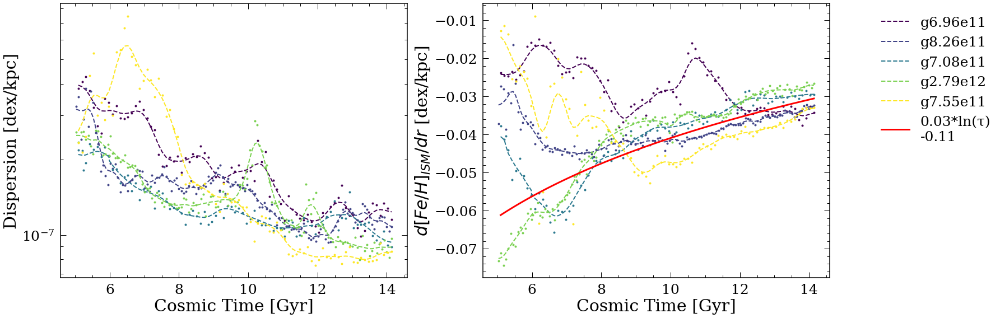

In [5]:
from scipy.optimize import curve_fit
from scipy.ndimage import gaussian_filter1d
colors = getcolor(range(7))

def loge(x, a, b):
    return a*np.log(x)+b

plt.figure(figsize=(25,8))
plt.subplot(1,2,2)
for i in range(len(sims)):
    name = ''
    for k in sims[i].split('_')[0].split('.'):
        name = name+k
    if name == 'g112e12':
        continue
    df = pd.read_pickle('ISM_slope_'+name+'.pkl')
    name = name[:2]+'.'+name[2:]
    
    m=df['time']>5
    df = df[m].reset_index(drop=True)
    
    plt.plot(df['time'].values, df['slope'].values,'.',color=colors[i])
    slopes = gaussian_filter1d(df['slope'].values, 2)
    plt.plot(df['time'].values, slopes,'--',label=name,color=colors[i])
    
    """
    m = df['time']>10
    popt, pcov = curve_fit(loge, df['time'].values[m], df['time'].values[m],
                           bounds=[[0,-10],[0.5,1]])
    print(popt)
    """
plt.plot(df['time'].values, loge(df['time'].values,0.03,-0.11),'r-',linewidth=3,
        label='0.03*ln(τ)\n-0.11')
    
plt.xlabel('Cosmic Time [Gyr]')
plt.ylabel('$d[Fe/H]_{ISM}/dr$ [dex/kpc]')
plt.legend(bbox_to_anchor=(1.5,1))

plt.subplot(1,2,1)
for i in range(len(sims)):
    name = ''
    for k in sims[i].split('_')[0].split('.'):
        name = name+k
    if name == 'g112e12':
        continue
    df = pd.read_pickle('ISM_slope_'+name+'.pkl')
    
    m=df['time']>5
    df = df[m].reset_index(drop=True)
    
    plt.semilogy(df['time'].values, df['residual'].values/df['gp_no'].values,'.',color=colors[i])
    slopes = gaussian_filter1d(df['residual'].values/df['gp_no'].values, 2)
    plt.semilogy(df['time'].values, slopes,'--',label=name,color=colors[i])
plt.xlabel('Cosmic Time [Gyr]')
plt.ylabel('Dispersion [dex/kpc]')    
plt.tight_layout()

# Show why it breaksdown (merger)

g7.55e11_3x9


100%|██████████| 128/128 [00:52<00:00,  2.44it/s]


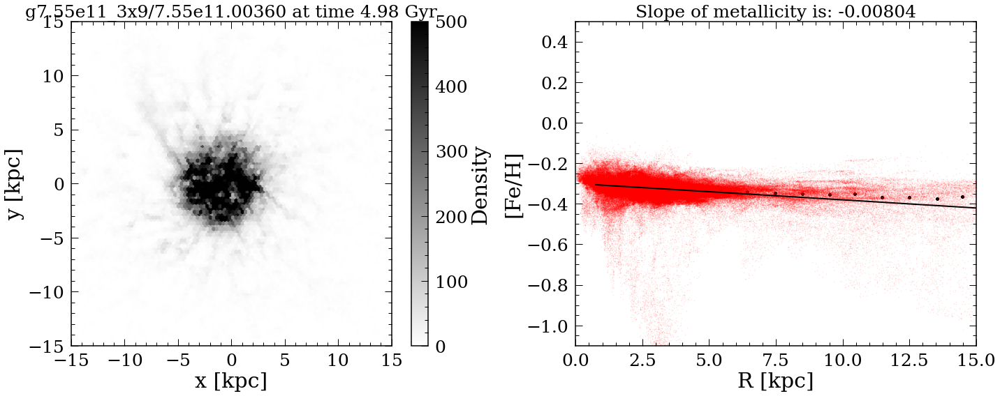

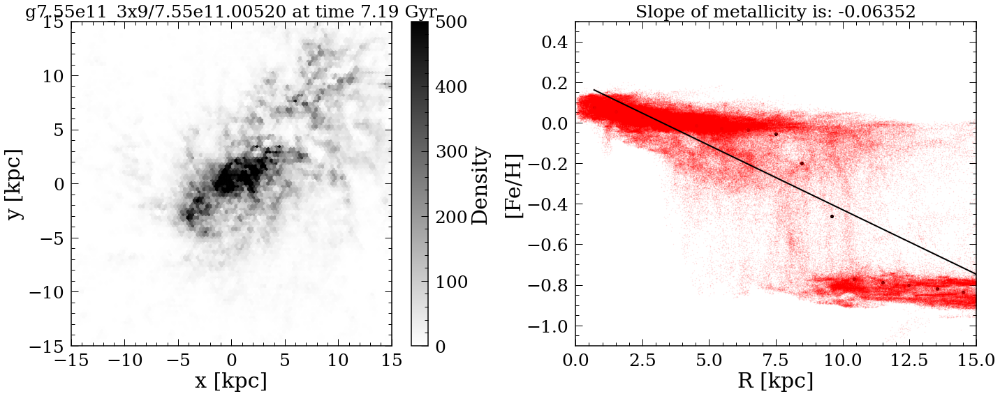

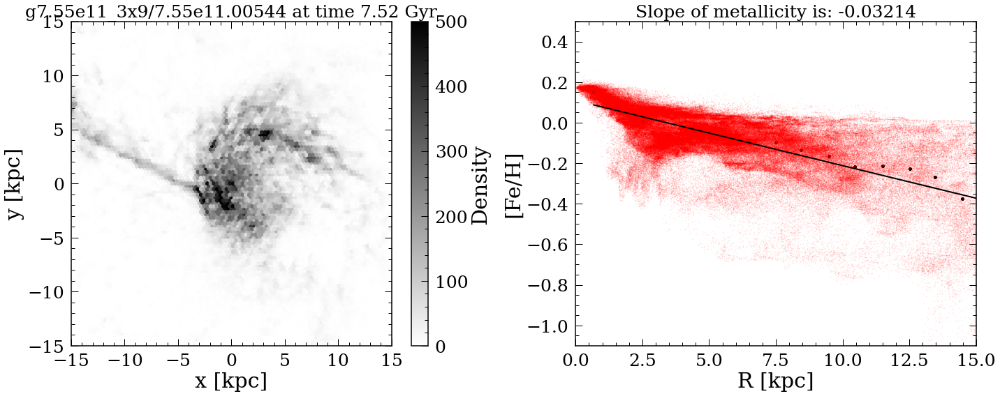

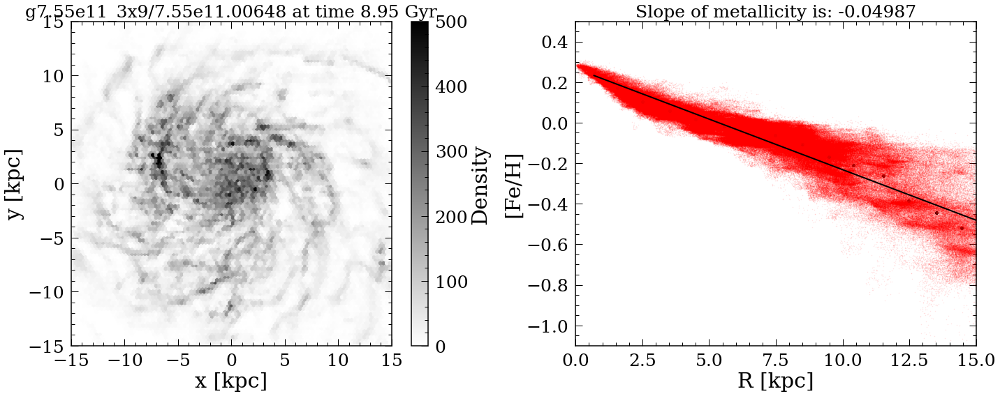

In [360]:
sim = sims[-1]
print(sim)
simsname = sim.split('_')[0]
allsnaps = glob.glob(sim+'/*.?????')

allsnaps_time = [int(i.split('.')[-1]) for i in allsnaps if (('param' not in i) and ('draco' not in i) and ('dat_' not in i) and ('79e12' not in i.split('.')[-1]))]
snaplookup = {int(allsnaps[i].split('.')[-1]):allsnaps[i] for i in range(len(allsnaps)) if (('param' not in allsnaps[i]) and ('draco' not in allsnaps[i]) and ('dat_' not in allsnaps[i]) and ('79e12' not in allsnaps[i].split('.')[-1]))}

allsnaps_time = sorted(allsnaps_time)
allages_ism = np.zeros(len(allsnaps_time))

for j in trange(len(allsnaps_time)):
    s = pb.load(snaplookup[allsnaps_time[j]])
    s.physical_units()
    allages_ism[j] = s.properties['time']

time2snap = {allages_ism[ii]:snaplookup[allsnaps_time[ii]] for ii in range(len(allsnaps_time))}

    
    
pltFehR_ISM(time2snap, 5, ylim=[-1.1,0.5])
pltFehR_ISM(time2snap, 7.2, ylim=[-1.1,0.5])
pltFehR_ISM(time2snap, 7.5, ylim=[-1.1,0.5])
pltFehR_ISM(time2snap, 9, ylim=[-1.1,0.5])


# My method

In [11]:
def readsimdata(simNo,Rcut,Rcut_thread,zcut_thread,disk=True):
    if disk:
        data=pd.read_pickle('./g'+simNo+'_z_0_decomp.pkl')
    else:
        data=pd.read_pickle('./g'+simNo+'_z_0.pkl')
    data['R']=np.sqrt((data['x'])**2+data['y']**2)
    
    if Rcut:
        data=data.loc[data['Rbir']<Rcut_thread].reset_index(drop=True)
        data=data.loc[abs(data['zbir'])<zcut_thread].reset_index(drop=True)
    data['dR']=data['R']-data['Rbir']
    data['dz']=abs(data['z'])-abs(data['zbir'])
    if disk:
        data = data.loc[(data['decomp']==1)|(data['decomp']==4)].reset_index()
    return data

def normalize_data(data):
    return (data-np.mean(data))/np.std(data)

def train(y, X):
    """
    
    Args:
        y (array): An Nstar array of rotation periods.
        X (array): An Nstar x NX array of features.
        
    Returns:
        weights (array): The array of weights of length NX + 1.
        
    """
    A = np.concatenate((np.ones((len(X), 1)), X), axis=1)  # Shape: Nstars x Nfeatures (incl crossterms)
    AT = A.T
    ATA = np.dot(AT, A)
    
    weights = np.linalg.solve(ATA, np.dot(AT, y))
    return weights

def calcRbir_cv(data, fold=5):
    fold = int(fold)

    try:
        args = data['feh'], data['age'], data['Rg']
        args_name = '[Fe/H]', 'τ', '$R_g$'
    except:
        args = data['feh'], data['age'], data['R']
        args_name = '[Fe/H]', 'τ', 'R'
    
    X = list(args)
    X_names = list(args_name)
    
    for a, b in combinations_with_replacement(args, 2):
        X.append(a * b)

    
    for a, b in combinations_with_replacement(args_name, 2):
        X_names.append(str(a + '*' + b))
        
    X = np.array(X).T


    # Define the number of training and validating stars.
    Ntest = int(1./float(fold)*np.shape(X)[0])
    y = data['Rbir'].values
    ypred = np.zeros(len(y))
    
    shuffle_inds = np.arange(len(y))
    np.random.shuffle(shuffle_inds)
        
    weights = np.zeros((len(X_names)+1, fold))
        
    for i in range(fold):
        if i == fold-1:
            startind = int(-Ntest)
            endind = int(len(shuffle_inds)-1)
        else:
            startind = int(i*Ntest)
            endind = int(Ntest*(i+1))
            
        train_inds = np.append(shuffle_inds[:startind],shuffle_inds[endind:])
        test_inds = shuffle_inds[startind:endind]
        y_train, X_train = y[train_inds], X[train_inds, :]
        y_test, X_test = y[test_inds], X[test_inds, :]

        weights[:, i] = train(y_train, X_train)

        A = np.concatenate((np.ones((len(X_test), 1)), X_test), axis=1)
        y_predict = np.dot(weights[:, i].T, A.T)
        ypred[test_inds] = y_predict

    return np.append(['$θ_C$'],X_names), [np.mean(weights[i,:]) for i in range(len(X_names)+1)], [np.std(weights[i,:]) for i in range(len(X_names)+1)], y, ypred

def calcRstd(data, Rbirbin=np.linspace(0,10,20)):
    Rbirs = np.zeros(len(Rbirbin)-1)
    Rstds = np.zeros(len(Rbirbin)-1)
    for i in range(len(Rbirbin)-1):
        data_loc = data.loc[(data['Rbir']>Rbirbin[i])&(data['Rbir']<Rbirbin[i+1])].reset_index(drop=True)
        Rstds[i] = np.std(data_loc['R']-data_loc['Rbir'])
        Rbirs[i] = (Rbirbin[i]+Rbirbin[i+1])/2
    return Rbirs, Rstds

def calcRstd_inf(infRbir, trueRbir, Rbirbin=np.linspace(0,10,20)):
    Rbirs = np.zeros(len(Rbirbin)-1)
    Rstds = np.zeros(len(Rbirbin)-1)
    Rbias = np.zeros(len(Rbirbin)-1)
    for i in range(len(Rbirbin)-1):
        m = (trueRbir>Rbirbin[i])&(trueRbir<Rbirbin[i+1])
        Rstds[i] = np.std(trueRbir[m]-infRbir[m])
        Rbias[i] = np.mean(infRbir[m])
        Rbirs[i] = (Rbirbin[i]+Rbirbin[i+1])/2
    return Rbirs, Rbias, Rstds

In [8]:
simsnames

['6.96e11', '8.26e11', '7.08e11', '1.12e12', '2.79e12', '7.55e11']

In [8]:
        
simNo='7.55e11'
Rcut=True
Rcut_thread=30
zcut_thread=2.5

print('Reading in simulation...')
data = readsimdata(simNo,Rcut,Rcut_thread,zcut_thread,disk=False)
"""
timereg = np.linspace(0,14,70)
allRs = data['Rbir'].values
allages = data['age'].values
for i in range(70-1):
    m = (allages>timereg[i])&(allages<timereg[i+1])
    allRs[m] = allRs[m]/np.std(allRs[m])
data['Rbir'] = allRs
"""

Reading in simulation...


"\ntimereg = np.linspace(0,14,70)\nallRs = data['Rbir'].values\nallages = data['age'].values\nfor i in range(70-1):\n    m = (allages>timereg[i])&(allages<timereg[i+1])\n    allRs[m] = allRs[m]/np.std(allRs[m])\ndata['Rbir'] = allRs\n"

In [205]:
data_premerg = data.loc[data['age']<6].reset_index(drop=True)
data_aftmerg = data.loc[data['age']>=9].reset_index(drop=True)
data_durmerg = data.loc[abs(data['age']-7.5)<1.5].reset_index(drop=True)
print('Finished reading in simulation...')

Finished reading in simulation...


In [206]:
print('Calculating weights...')
print(len(data), len(data_premerg),len(data_aftmerg),len(data_durmerg))
allnames, weights, weights_err, y, ypred = calcRbir_cv(data)
allnames_pm, weights_pm, weights_err_pm, y_pm, ypred_pm = calcRbir_cv(data_premerg)
allnames_am, weights_am, weights_err_am, y_am, ypred_am = calcRbir_cv(data_aftmerg)
allnames_dm, weights_dm, weights_err_dm, y_dm, ypred_dm = calcRbir_cv(data_durmerg)
print('Finished calculating weights...')

Calculating weights...
1400403 952312 127708 320383
Finished calculating weights...


In [207]:
m = (abs(np.array(weights, dtype=float))>0.1)
weights, weights_err, weights_pm, weights_err_pm, weights_dm, weights_err_dm, weights_am, weights_err_am, allnames = np.array(weights), np.array(weights_err), np.array(weights_pm), np.array(weights_err_pm), np.array(weights_dm), np.array(weights_err_dm), np.array(weights_am), np.array(weights_err_am), np.array(allnames)
print(weights, allnames)
absweights, weights_imp, weights_imp_err, weights_imp_pm, weights_imp_err_pm,  weights_imp_dm, weights_imp_err_dm, weights_imp_am, weights_imp_err_am, allnames = zip(*sorted(zip(abs(np.array(weights[m])), weights[m], weights_err[m], weights_pm[m], weights_err_pm[m], weights_dm[m], weights_err_dm[m], weights_am[m], weights_err_am[m], allnames[m])))
weights_imp, weights_imp_pm, weights_imp_dm, weights_imp_am, allnames = weights_imp[::-1], weights_imp_dm[::-1], weights_imp_pm[::-1], weights_imp_am[::-1], allnames[::-1]


[ 3.91231978e+00 -1.52470270e+01  3.31042440e-01  5.97268955e-01
 -1.20724685e+00  6.80079005e-01  1.39355198e-02 -9.28560392e-02
 -2.15242003e-02 -1.28021674e-02] ['$θ_C$' '[Fe/H]' 'τ' '$R_g$' '[Fe/H]*[Fe/H]' '[Fe/H]*τ' '[Fe/H]*$R_g$'
 'τ*τ' 'τ*$R_g$' '$R_g$*$R_g$']


/data/shared_data/anaconda3/lib/python3.9/site-packages/numpy/core/_methods.py:261: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/data/shared_data/anaconda3/lib/python3.9/site-packages/numpy/core/_methods.py:221: RuntimeWarning: invalid value encountered in true_divide
  arrmean = um.true_divide(arrmean, div, out=arrmean, casting='unsafe',
/data/shared_data/anaconda3/lib/python3.9/site-packages/numpy/core/_methods.py:253: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/data/shared_data/anaconda3/lib/python3.9/site-packages/numpy/core/fromnumeric.py:3419: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/data/shared_data/anaconda3/lib/python3.9/site-packages/numpy/core/_methods.py:188: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


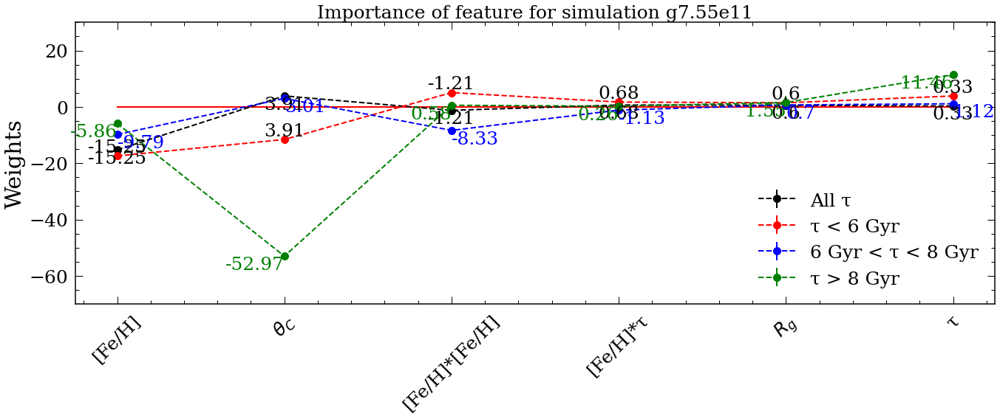

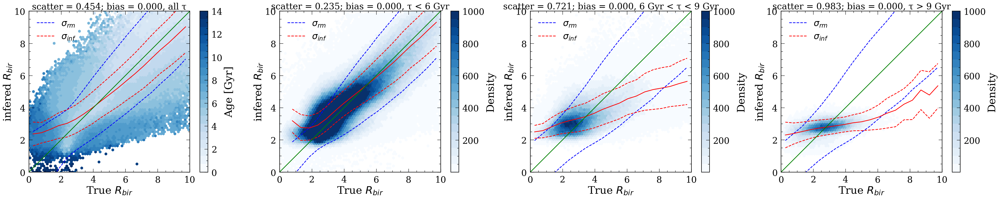

In [208]:
plt.figure(figsize=(19,8))
plt.errorbar(range(len(allnames)), np.array(weights_imp), yerr=np.array(weights_imp_err), fmt='k--o', markersize=10, label='All τ')
plt.errorbar(range(len(allnames)), np.array(weights_imp_pm), yerr=np.array(weights_imp_err_pm), fmt='r--o', markersize=10, label='τ < 6 Gyr')
plt.errorbar(range(len(allnames)), np.array(weights_imp_dm), yerr=np.array(weights_imp_err_dm), fmt='b--o', markersize=10, label='6 Gyr < τ < 8 Gyr')
plt.errorbar(range(len(allnames)), np.array(weights_imp_am), yerr=np.array(weights_imp_err_am), fmt='g--o', markersize=10, label='τ > 8 Gyr')
plt.plot(range(len(allnames)),np.zeros(len(allnames)),'r-')
plt.xticks(range(len(allnames)), allnames, rotation=45)
plt.ylabel('Weights')
plt.ylim([-70,30])
plt.legend()
plt.title('Importance of feature for simulation g%s'%simNo, fontsize=25)
for j, txt in enumerate(weights_imp):
    txt = np.round(txt,2)
    plt.annotate(txt, (j, weights_imp[j]),size=25,horizontalalignment='center', verticalalignment='top')

for j, txt in enumerate(weights_imp):
    txt = np.round(txt,2)
    plt.annotate(txt, (j, weights_imp_pm[j]),size=25,horizontalalignment='center', verticalalignment='bottom')
    
for j, txt in enumerate(weights_imp_dm):
    txt = np.round(txt,2)
    plt.annotate(txt, (j, weights_imp_dm[j]),size=25,horizontalalignment='left', verticalalignment='top', color='b')

for j, txt in enumerate(weights_imp_am):
    txt = np.round(txt,2)
    plt.annotate(txt, (j, weights_imp_am[j]),size=25,horizontalalignment='right', verticalalignment='top', color='g')
    
plt.tight_layout()
#plt.savefig(simNo+'_importance.png')

xs = np.linspace(0, 30, 100)
plt.figure(figsize=(40,8), dpi=100)
plt.subplot(1,4,1)
scatter = sum((y-ypred)**2/y)/len(y)
bias  = np.mean(y-ypred)
cmap = plt.cm.get_cmap('Blues',20)
plt.hexbin(y, ypred, C=data['age'], extent=(0,10,0,10),gridsize=70, mincnt=1, cmap=cmap,
          vmin=0, vmax=14)
Rbirs, Rstds = calcRstd(data)
Rbirs_inf, Rbias_inf, Rstds_inf = calcRstd_inf(ypred, y)
plt.plot(Rbirs, Rbirs+Rstds, 'b--', label = '$σ_{rm}$')
plt.plot(Rbirs, Rbirs-Rstds, 'b--')
plt.plot(Rbirs_inf, Rbias_inf-Rstds_inf, 'r--', label = '$σ_{inf}$')
plt.plot(Rbirs_inf, Rbias_inf+Rstds_inf, 'r--')
plt.plot(Rbirs_inf, Rbias_inf, 'r-')
plt.plot([0,10], [0,10], 'g-')
plt.xlim(0, 10)
plt.ylim(0, 10)
plt.xlabel("True $R_{bir}$")
plt.ylabel("infered $R_{bir}$")
plt.title('scatter = %.3f; bias = %.3f, all τ'%(scatter, bias),fontsize=25)
plt.legend()
cb = plt.colorbar()
cb.set_label('Age [Gyr]')

plt.subplot(1,4,2)
scatter = sum((y_pm-ypred_pm)**2/y_pm)/len(y_pm)
bias  = np.mean(y_pm-ypred_pm)
plt.hexbin(y, ypred, extent=(0,10,0,10),gridsize=70, mincnt=1, cmap=cmap,
          vmin=1, vmax=1000)
Rbirs, Rstds = calcRstd(data_premerg)
Rbirs_inf, Rbias_inf, Rstds_inf = calcRstd_inf(ypred_pm, y_pm)
plt.plot(Rbirs, Rbirs+Rstds, 'b--', label = '$σ_{rm}$')
plt.plot(Rbirs, Rbirs-Rstds, 'b--')
plt.plot(Rbirs_inf, Rbias_inf-Rstds_inf, 'r--', label = '$σ_{inf}$')
plt.plot(Rbirs_inf, Rbias_inf+Rstds_inf, 'r--')
plt.plot(Rbirs_inf, Rbias_inf, 'r-')
plt.plot([0,10], [0,10], 'g-')
plt.xlim(0, 10)
plt.ylim(0, 10)
plt.xlabel("True $R_{bir}$")
plt.ylabel("infered $R_{bir}$")
plt.title('scatter = %.3f; bias = %.3f, τ < 6 Gyr'%(scatter, bias),fontsize=25)
plt.legend()
cb = plt.colorbar()
cb.set_label('Density')

plt.subplot(1,4,3)
scatter = sum((y_dm-ypred_dm)**2/y_dm)/len(y_dm)
bias  = np.mean(y_dm-ypred_dm)
plt.hexbin(y_dm, ypred_dm, extent=(0,10,0,10),gridsize=70, mincnt=1, cmap=cmap,
          vmin=1, vmax=1000)
Rbirs, Rstds = calcRstd(data_durmerg)
Rbirs_inf, Rbias_inf, Rstds_inf = calcRstd_inf(ypred_dm, y_dm)
plt.plot(Rbirs, Rbirs+Rstds, 'b--', label = '$σ_{rm}$')
plt.plot(Rbirs, Rbirs-Rstds, 'b--')
plt.plot(Rbirs_inf, Rbias_inf-Rstds_inf, 'r--', label = '$σ_{inf}$')
plt.plot(Rbirs_inf, Rbias_inf+Rstds_inf, 'r--')
plt.plot(Rbirs_inf, Rbias_inf, 'r-')
plt.plot([0,10], [0,10], 'g-')
plt.xlim(0, 10)
plt.ylim(0, 10)
plt.xlabel("True $R_{bir}$")
plt.ylabel("infered $R_{bir}$")
plt.title('scatter = %.3f; bias = %.3f, 6 Gyr < τ < 9 Gyr'%(scatter, bias),fontsize=25)
plt.legend()
cb = plt.colorbar()
cb.set_label('Density')


plt.subplot(1,4,4)
scatter_am = sum((y_am-ypred_am)**2/y_am)/len(y_am)
bias_am  = np.mean(y_am-ypred_am)
plt.hexbin(y_am, ypred_am, extent=(0,10,0,10),gridsize=70, mincnt=10, cmap=cmap, 
           vmin=1, vmax=1000)
Rbirs_am, Rstds_am = calcRstd(data_aftmerg)
Rbirs_inf, Rbias_inf, Rstds_inf = calcRstd_inf(ypred_am, y_am)
plt.plot(Rbirs, Rbirs+Rstds, 'b--', label = '$σ_{rm}$')
plt.plot(Rbirs, Rbirs-Rstds, 'b--')
plt.plot(Rbirs_inf, Rbias_inf-Rstds_inf, 'r--', label = '$σ_{inf}$')
plt.plot(Rbirs_inf, Rbias_inf+Rstds_inf, 'r--')
plt.plot(Rbirs_inf, Rbias_inf, 'r-')
plt.plot([0,10], [0,10], 'g-')
plt.xlim(0, 10)
plt.ylim(0, 10)
plt.xlabel("True $R_{bir}$")
plt.ylabel("infered $R_{bir}$")
plt.title('scatter = %.3f; bias = %.3f, τ > 9 Gyr'%(scatter_am, bias_am),fontsize=25)
plt.legend()
cb = plt.colorbar()
cb.set_label('Density')
plt.tight_layout()
    

In [14]:
data_premerg = data.loc[data['age']<6].reset_index(drop=True)
data_aftmerg = data.loc[data['age']>=9].reset_index(drop=True)
data_durmerg = data.loc[abs(data['age']-7.5)<1.5].reset_index(drop=True)

In [9]:
def predww(df, weights):
    args = df['feh'], df['age'], df['Rg']
    args_name = '[Fe/H]', 'τ', '$R_g$'


    X = list(args)
    X_names = list(args_name)

    for a, b in combinations_with_replacement(args, 2):
        X.append(a * b)


    for a, b in combinations_with_replacement(args_name, 2):
        X_names.append(str(a + '*' + b))

    X = np.array(X).T
    A = np.concatenate((np.ones((len(X), 1)), X), axis=1)

    y_pred = np.dot(np.array(weights_pm).T, A.T)
    return y_pred


# Why doesn't it work

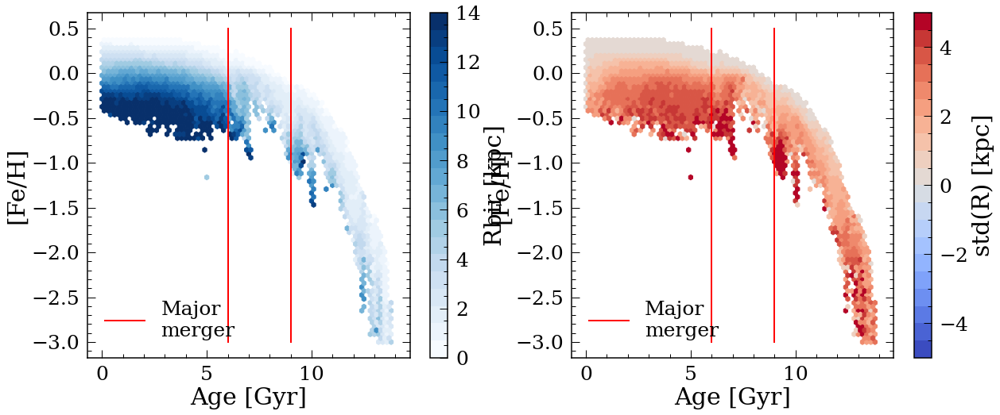

In [134]:
plt.figure(figsize=(20,8))
cmap = plt.cm.get_cmap('Blues',20)
plt.subplot(1,2,1)
plt.hexbin(data['age'], data['feh'], C=data['Rbir'], extent=(0,14,-3,0.5),gridsize=70, mincnt=1, cmap=cmap, 
           vmin=0, vmax=14)
cb = plt.colorbar()
cb.set_label('Rbir [kpc]')
plt.xlabel('Age [Gyr]')
plt.ylabel('[Fe/H]')
plt.plot([6,6],[-3,0.5],'r-',label='Major\nmerger')
plt.plot([9,9],[-3,0.5],'r-')
plt.legend(loc=3, fontsize=25)

cmap = plt.cm.get_cmap('coolwarm',20)
plt.subplot(1,2,2)
plt.hexbin(data['age'], data['feh'], C=data['R']-data['Rbir'], extent=(0,14,-3,0.5),gridsize=70, mincnt=1, cmap=cmap, 
           vmin=-5, vmax=5, reduce_C_function = np.std)
cb = plt.colorbar()
cb.set_label('std(R) [kpc]')
plt.xlabel('Age [Gyr]')
plt.ylabel('[Fe/H]')
plt.plot([6,6],[-3,0.5],'r-',label='Major\nmerger')
plt.plot([9,9],[-3,0.5],'r-')
plt.legend(loc=3, fontsize=25)

In [17]:
simsnames

['6.96e11', '8.26e11', '7.08e11', '1.12e12', '2.79e12', '7.55e11']

In [88]:
mergernames = ['g'+i+'_merger_Lucy.dat' for i in simsnames]
mergernames

['g6.96e11_merger_Lucy.dat',
 'g8.26e11_merger_Lucy.dat',
 'g7.08e11_merger_Lucy.dat',
 'g1.12e12_merger_Lucy.dat',
 'g2.79e12_merger_Lucy.dat',
 'g7.55e11_merger_Lucy.dat']

/tmp/ipykernel_2645741/2717219996.py:69: MatplotlibDeprecationWarning: Starting from Matplotlib 3.6, colorbar() will steal space from the mappable's axes, rather than from the current axes, to place the colorbar.  To silence this warning, explicitly pass the 'ax' argument to colorbar().
  cbar = plt.colorbar(orientation='horizontal')
/tmp/ipykernel_2645741/2717219996.py:91: MatplotlibDeprecationWarning: Starting from Matplotlib 3.6, colorbar() will steal space from the mappable's axes, rather than from the current axes, to place the colorbar.  To silence this warning, explicitly pass the 'ax' argument to colorbar().
  cbar = plt.colorbar(orientation='horizontal')
/tmp/ipykernel_2645741/2717219996.py:69: MatplotlibDeprecationWarning: Starting from Matplotlib 3.6, colorbar() will steal space from the mappable's axes, rather than from the current axes, to place the colorbar.  To silence this warning, explicitly pass the 'ax' argument to colorbar().
  cbar = plt.colorbar(orientation='horiz

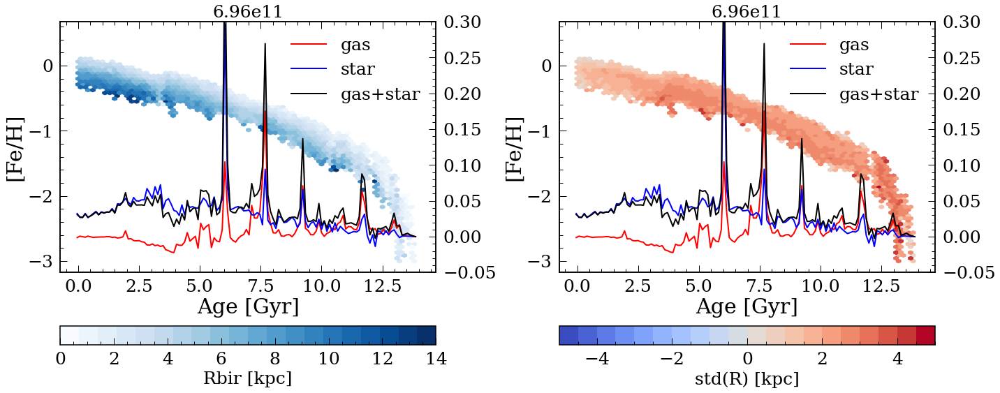

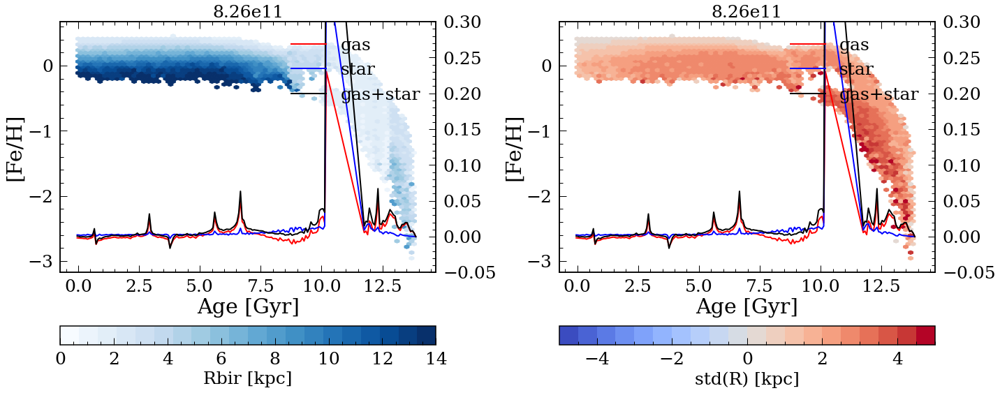

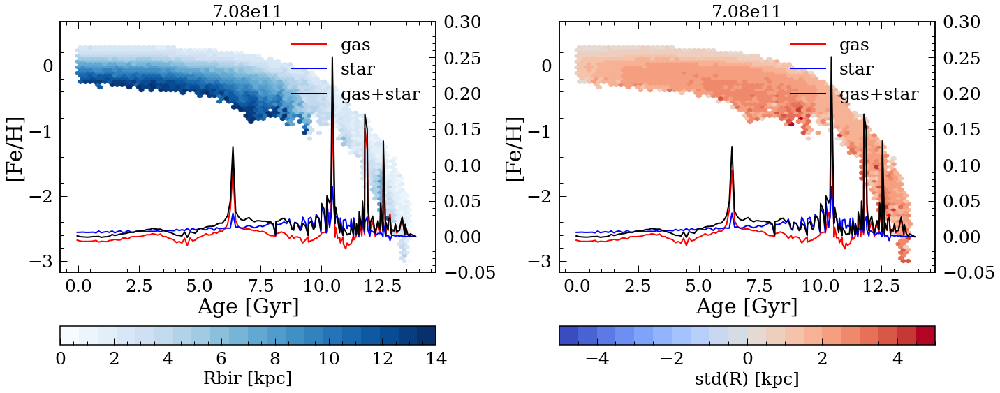

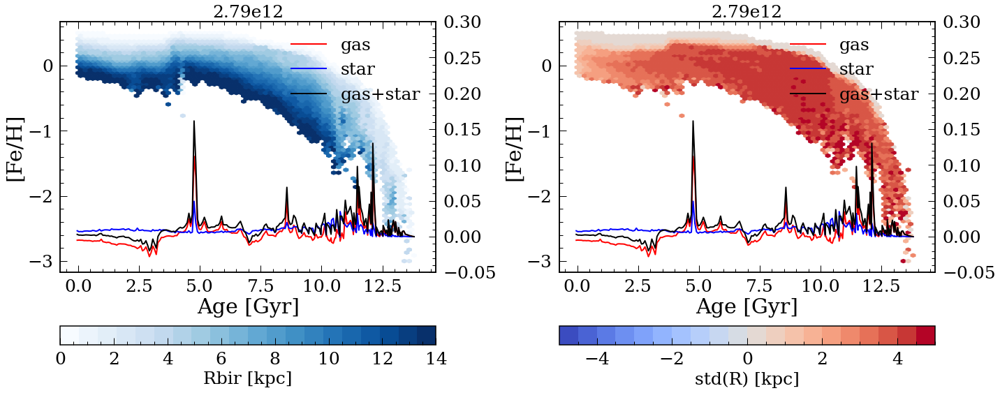

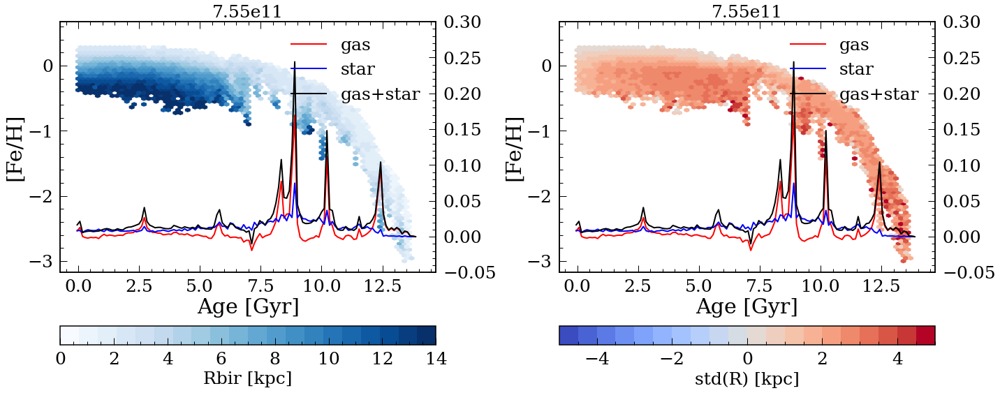

In [11]:
from scipy.ndimage import gaussian_filter1d
for i, simNo in enumerate(simsnames):
    simNo = simNo
    Rcut=True
    Rcut_thread=30
    zcut_thread=2.5

    try:
        data = readsimdata(simNo,Rcut,Rcut_thread,zcut_thread,disk=True)
    except:
        continue
    
    name = ''
    
    for k in sims[i].split('_')[0].split('.'):
        name = name+k
    if name == '112e12':
        continue
        
    df = pd.read_pickle('ISM_slope_'+name+'.pkl')
    
        
    df = df.sort_values('time')
    df = df.dropna(subset=['masses','slope'])
    df['masses'] = gaussian_filter1d(df['masses'], 2)
    df['slope'] = gaussian_filter1d(df['slope'], 2)
    df['diffmass'] = np.append([0], np.diff(df['M_gas'].values)/np.median(df['M_gas'].values))
    df['diffmass_star'] = np.append([0], np.diff(df['M_star'].values)/np.median(df['M_star'].values))
    df['diffslope'] = np.append([0], np.diff(df['slope'].values))
    #print(name)
    
    
    plt.figure(figsize=(20,8))
    plt.subplot(1,2,1)
    cmap = plt.cm.get_cmap('Blues',20)
    plt.hexbin(data['age'], data['feh'], C=data['Rbir'], extent=(0,14,-3,0.5),gridsize=70, mincnt=1, cmap=cmap, 
               vmin=0, vmax=14)
    plt.ylabel('[Fe/H]')
    plt.xlabel('Age [Gyr]')
    
    plt.twinx()
    plt.plot(14.1-df['time'],df['diffmass'],'r-',label='gas')
    plt.plot(14.1-df['time'],df['diffmass_star'],'b-',label='star')
    plt.plot(14.1-df['time'],df['diffmass_star']+df['diffmass'],'k-',label='gas+star')
    plt.ylim([-0.05,0.3])
    
    """
    if ('1.12e12' not in simsnames[i]) and ('8.26e11' not in simsnames[i]):
        df_merg = pd.read_pickle(mergernames[i])
        mergtime = 14.1 - df_merg['time']
        mergratio = df_merg['vir_ratio']
        plt.plot(mergtime, mergratio, 'r^', label='merger')
        plt.ylim([0,1])
        #plt.ylabel('$ΔM$/$M$')
        plt.ylabel('Merger Mass ratio')
    
   
    if ('1.12e12' not in simsnames[i]) and ('8.26e11' not in simsnames[i]):
        df_merg = pd.read_pickle(mergernames[i])
        mergtime = 14.1 - df_merg['time']
        mergratio = df_merg['vir_ratio']
        for jj in range(len(mergtime)):
            if jj==0:
                plt.plot([mergtime[jj], mergtime[jj]], [0, mergratio[jj]], 'k^-',label='Merger')
            else:
                plt.plot([mergtime[jj], mergtime[jj]], [0, mergratio[jj]], 'k^-')
    """
    
    cbar = plt.colorbar(orientation='horizontal')
    car = cbar.set_label('Rbir [kpc]',fontsize = 25,labelpad = 5)

    plt.title(simNo, fontsize=25)
    plt.legend(loc=1)
    plt.tight_layout()

    
    plt.subplot(1,2,2)
    cmap = plt.cm.get_cmap('coolwarm',20)
    plt.hexbin(data['age'], data['feh'], C=data['R'], extent=(0,14,-3,0.5),gridsize=70, mincnt=1, cmap=cmap, 
               vmin=-5, vmax=5, reduce_C_function=np.std)
    plt.ylabel('[Fe/H]')
    plt.xlabel('Age [Gyr]')
    
    plt.twinx()
    plt.plot(14.1-df['time'],df['diffmass'],'r-',label='gas')
    plt.plot(14.1-df['time'],df['diffmass_star'],'b-',label='star')
    plt.plot(14.1-df['time'],df['diffmass_star']+df['diffmass'],'k-',label='gas+star')
    plt.ylim([-0.05,0.3])
    
    
    cbar = plt.colorbar(orientation='horizontal')
    car = cbar.set_label('std(R) [kpc]',fontsize = 25,labelpad = 5)

    plt.title(simNo, fontsize=25)
    plt.legend(loc=1)
    plt.tight_layout()





In [12]:
name

'g755e11'

/data/shared_data/anaconda3/lib/python3.9/site-packages/numpy/core/_methods.py:261: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/data/shared_data/anaconda3/lib/python3.9/site-packages/numpy/core/_methods.py:221: RuntimeWarning: invalid value encountered in true_divide
  arrmean = um.true_divide(arrmean, div, out=arrmean, casting='unsafe',
/data/shared_data/anaconda3/lib/python3.9/site-packages/numpy/core/_methods.py:253: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/tmp/ipykernel_3350811/291741943.py:58: MatplotlibDeprecationWarning: Starting from Matplotlib 3.6, colorbar() will steal space from the mappable's axes, rather than from the current axes, to place the colorbar.  To silence this warning, explicitly pass the 'ax' argument to colorbar().
  cbar = plt.colorbar(orientation='horizontal')
/tmp/ipykernel_3350811/291741943.py:81: MatplotlibDeprecationWarning: Startin

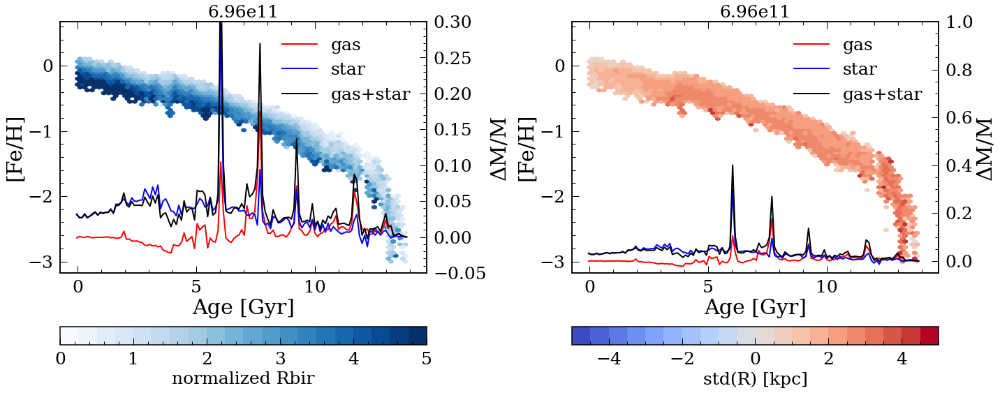

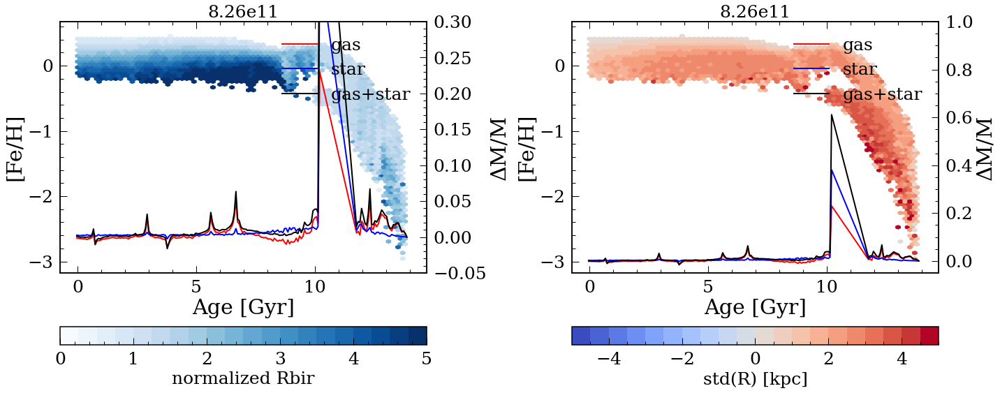

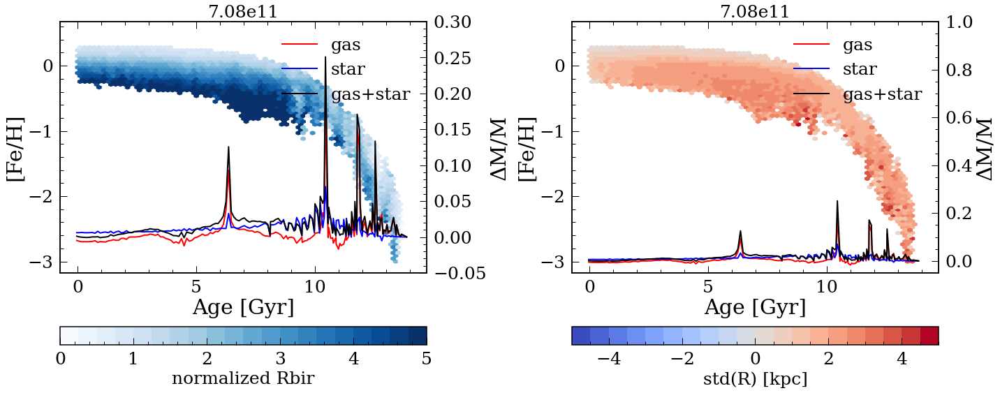

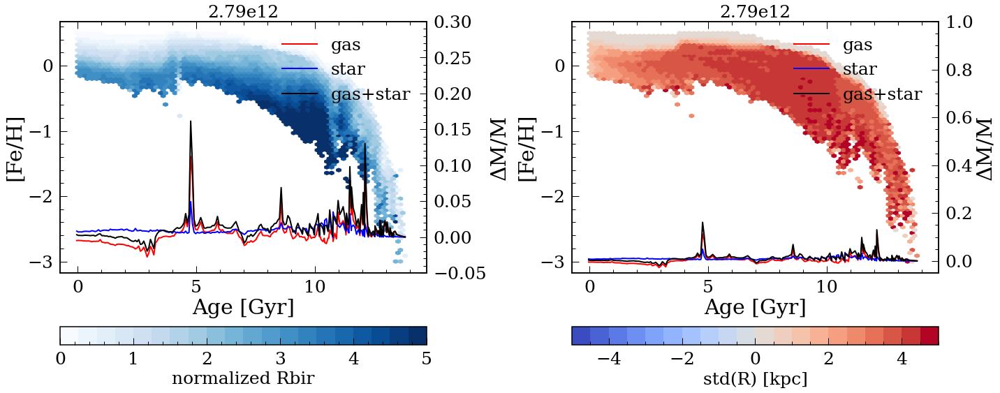

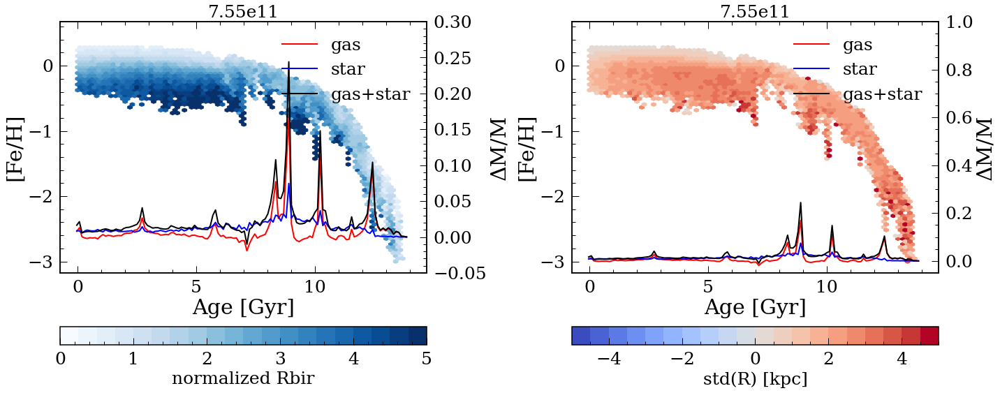

In [238]:
for i, simNo in enumerate(simsnames):
    simNo = simNo
    Rcut=True
    Rcut_thread=30
    zcut_thread=2.5

    try:
        data = readsimdata(simNo,Rcut,Rcut_thread,zcut_thread,disk=True)
    except:
        continue
    
    
    
    name = ''
    
    for k in sims[i].split('_')[0].split('.'):
        name = name+k
    if name == 'g112e12':
        continue
        
    df = pd.read_pickle('ISM_slope_'+name+'.pkl')
    
        
    df = df.sort_values('time')
    df = df.dropna(subset=['masses','slope'])
    df['masses'] = gaussian_filter1d(df['masses'], 2)
    df['slope'] = gaussian_filter1d(df['slope'], 2)
    df['diffmass'] = np.append([0], np.diff(df['M_gas'].values)/np.median(df['M_gas'].values))
    df['diffmass_star'] = np.append([0], np.diff(df['M_star'].values)/np.median(df['M_star'].values))
    df['diffslope'] = np.append([0], np.diff(df['slope'].values))
    #print(name)
    
    # normalize R
    timereg = np.linspace(0,14,70)
    allRs = data['Rbir'].values
    allages = data['age'].values
    for i in range(70-1):
        m = (allages>timereg[i])&(allages<timereg[i+1])
        m2 = (df['time']>timereg[i])&(df['time']<timereg[i+1])
        allRs[m] = allRs[m]/np.mean(df['half_mass_l2'][m2]/1000)
    data['Rbir_norm'] = allRs
    
    plt.figure(figsize=(20,8))
    plt.subplot(1,2,1)
    cmap = plt.cm.get_cmap('Blues',20)
    plt.hexbin(data['age'], data['feh'], C=data['Rbir_norm'], extent=(0,14,-3,0.5),gridsize=70, mincnt=1, cmap=cmap, 
               vmin=0, vmax=5)
    plt.ylabel('[Fe/H]')
    plt.xlabel('Age [Gyr]')
    
    plt.twinx()
    plt.plot(14.1-df['time'],df['diffmass'],'r-',label='gas')
    plt.plot(14.1-df['time'],df['diffmass_star'],'b-',label='star')
    plt.plot(14.1-df['time'],df['diffmass_star']+df['diffmass'],'k-',label='gas+star')
    plt.ylim([-0.05,0.3])
    plt.ylabel('ΔM/M')

    
    cbar = plt.colorbar(orientation='horizontal')
    car = cbar.set_label('normalized Rbir',fontsize = 25,labelpad = 5)

    plt.title(simNo, fontsize=25)
    plt.legend(loc=1)
    plt.tight_layout()

    
    plt.subplot(1,2,2)
    cmap = plt.cm.get_cmap('coolwarm',20)
    plt.hexbin(data['age'], data['feh'], C=data['R'], extent=(0,14,-3,0.5),gridsize=70, mincnt=1, cmap=cmap, 
               vmin=-5, vmax=5, reduce_C_function=np.std)
    plt.ylabel('[Fe/H]')
    plt.xlabel('Age [Gyr]')
    
    plt.twinx()
    plt.plot(14.1-df['time'],df['diffmass'],'r-',label='gas')
    plt.plot(14.1-df['time'],df['diffmass_star'],'b-',label='star')
    plt.plot(14.1-df['time'],df['diffmass_star']+df['diffmass'],'k-',label='gas+star')
    plt.ylim([-0.05,1])
    plt.ylabel('ΔM/M')
    
    
    cbar = plt.colorbar(orientation='horizontal')
    car = cbar.set_label('std(R) [kpc]',fontsize = 25,labelpad = 5)

    plt.title(simNo, fontsize=25)
    plt.legend(loc=1)
    plt.tight_layout()






In [51]:
sim = sims[-1]
simsname = sim.split('_')[0]
allsnaps = glob.glob(sim+'/*.?????')

allsnaps_time = [int(i.split('.')[-1]) for i in allsnaps if (('param' not in i) and ('draco' not in i) and ('dat_' not in i) and ('79e12' not in i.split('.')[-1]))]
snaplookup = {int(allsnaps[i].split('.')[-1]):allsnaps[i] for i in range(len(allsnaps)) if (('param' not in allsnaps[i]) and ('draco' not in allsnaps[i]) and ('dat_' not in allsnaps[i]) and ('79e12' not in allsnaps[i].split('.')[-1]))}

allsnaps_time = sorted(allsnaps_time)
allages_ism = np.zeros(len(allsnaps_time))

for j in trange(len(allsnaps_time)):
    s = pb.load(snaplookup[allsnaps_time[j]])
    s.physical_units()
    allages_ism[j] = s.properties['time']

time2snap = {allages_ism[ii]:snaplookup[allsnaps_time[ii]] for ii in range(len(allsnaps_time))}


allage_times = np.array(list(time2snap.keys()), dtype=float)





100%|██████████| 128/128 [00:34<00:00,  3.71it/s]


In [60]:
data

,index,z,metals,rxy,y,mass,eps,x,phi,j_circ,...,age,Rbir,zbir,R,dR,dz,jzc,Rg,vc,Rg_norm
0,94,-0.313035,0.000081,8.032465,-3.484309,5496.356586,0.176849,7.237409,-178839.577186,1799.756312,...,13.692442,7.597391,0.767287,8.032465,0.435074,-0.454252,1799.756312,2.767583,186.984713,2.767583
1,100,-1.666201,0.000046,1.381980,-0.071391,5498.498204,0.176849,-1.380134,-219647.186633,816.495058,...,13.682098,7.365390,0.799757,1.381980,-5.983410,0.866444,816.495058,0.820484,162.731233,0.820484
2,111,0.975716,0.000098,6.359659,-6.309740,5506.211178,0.176849,0.795270,-185664.754206,1146.634979,...,13.676065,3.590378,0.300819,6.359659,2.769282,0.674897,1146.634979,1.158171,187.615193,1.158171
3,113,1.494876,0.000064,5.755986,4.217794,5498.498810,0.176849,3.916835,-189001.645815,1398.460934,...,13.672617,0.886069,-0.608576,5.755986,4.869917,0.886300,1398.460934,2.288951,188.518606,2.288951
4,115,0.221185,0.000059,1.719997,1.373545,5498.498810,0.176849,-1.035259,-234566.552444,616.191376,...,13.671755,2.381456,0.637135,1.719997,-0.661460,-0.415950,616.191376,0.508280,175.937513,0.508280
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1400398,3973487,-0.076972,0.014643,10.887157,-9.382256,9265.895785,0.176849,-5.522995,-168273.183366,3375.947549,...,0.000012,10.891231,0.167669,10.887157,-0.004074,-0.090697,3375.947549,2.298355,186.276505,2.298355
1400399,3973492,1.330942,0.020718,10.061221,9.227943,9265.895785,0.176849,4.009143,-171520.465088,2167.357861,...,0.000012,10.084337,1.084961,10.061221,-0.023116,0.245981,2167.357861,1.489677,186.553840,1.489677
1400400,3973493,1.264259,0.019323,9.993029,9.185493,9265.895785,0.176849,3.935396,-171777.559169,2102.381039,...,0.000012,10.014569,1.019399,9.993029,-0.021540,0.244860,2102.381039,1.433456,186.576190,1.433456
1400401,3973494,1.237639,0.018874,10.305227,9.428079,9265.895785,0.176849,4.160412,-170865.546015,2293.268520,...,0.000012,10.325998,0.986438,10.305227,-0.020771,0.251200,2293.268520,1.627601,186.473865,1.627601


(-0.9307104345013334, 0.0)
(-0.42710084811773774, 0.0)
[9.64649504e-01 9.56801674e-01 9.45708342e-01 9.36415036e-01
 9.29493038e-01            nan 9.16450550e-01 9.17356329e-01
 8.98332582e-01 8.97979544e-01 8.90067755e-01 8.83449940e-01
 8.65499231e-01 8.56197175e-01 8.58502521e-01 8.18943469e-01
 8.05569402e-01 7.95607380e-01 7.86755060e-01 8.02010998e-01
 8.02865118e-01 7.93198782e-01 7.72438649e-01 7.63949595e-01
 7.62840129e-01 7.31375115e-01 6.91502369e-01 6.17433980e-01
 6.11705568e-01 5.63712602e-01 2.78262696e-01 2.86301524e-01
 2.82775940e-01 3.24949276e-01 3.51688981e-01 1.71593658e-01
 2.53573242e-01 1.08623285e-01 5.21870693e-02 2.64390548e-01
 1.04425873e-01 2.69524594e-02 7.40163882e-02 5.78124723e-02
 6.24592985e-02 1.00018844e-01 1.08068267e-01 5.36222672e-02
 6.97577519e-02 1.44240460e-01 1.48543549e-01 1.52208979e-01
 8.63669339e-02 1.01418027e-01 9.26977413e-02 5.52762728e-02
 5.43738745e-02 5.24421053e-02 4.00183820e-02 3.67665171e-02
 1.39057011e-01 6.96604845e-02

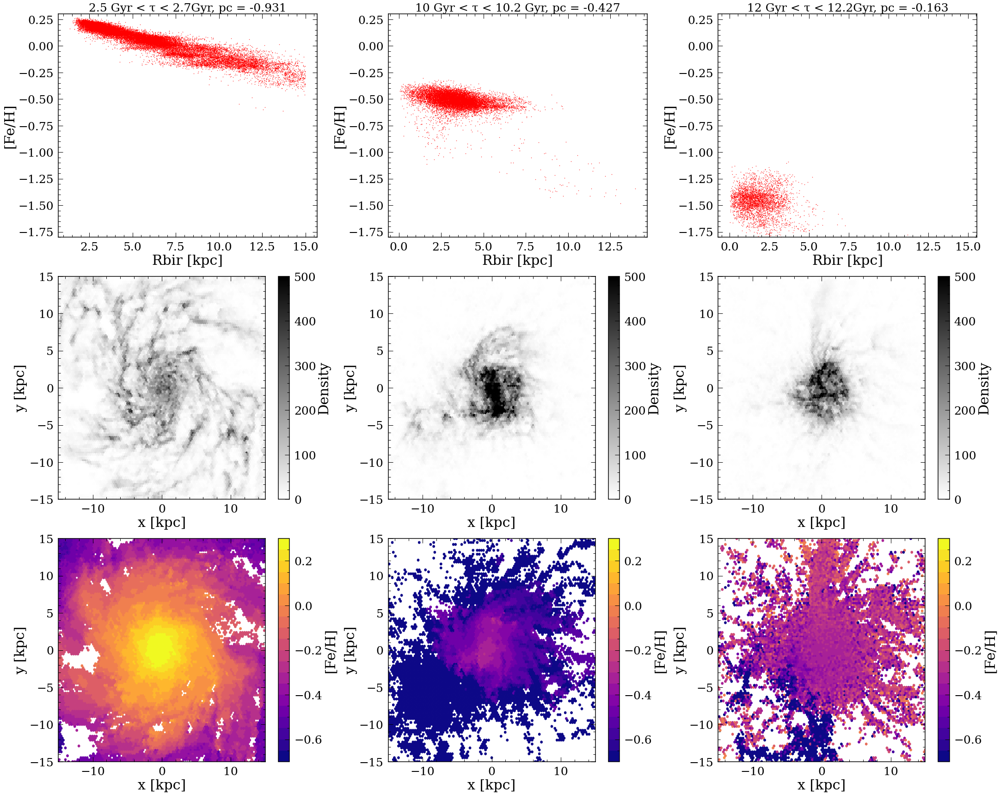

In [59]:
from scipy import stats

plt.figure(figsize=(30,24))
plt.subplot(3,3,1)

data_sing = data.loc[(data['age']>2.5)&(data['age']<2.7)]
plt.plot(data_sing['Rbir'],data_sing['feh'],'r.',markersize=1)
plt.xlabel('Rbir [kpc]')
plt.ylabel('[Fe/H]')
pc = stats.pearsonr(data_sing['Rbir'], data_sing['feh'])
plt.title('2.5 Gyr < τ < 2.7Gyr, pc = %.3f'%pc[0], fontsize=25)
plt.ylim([-1.8, 0.3])
print(pc)

plt.subplot(3,3,2)
data_sing = data.loc[(data['age']>10)&(data['age']<10.2)]
plt.plot(data_sing['Rbir'],data_sing['feh'],'r.',markersize=1)
pc = stats.pearsonr(data_sing['Rbir'], data_sing['feh'])
plt.xlabel('Rbir [kpc]')
plt.ylabel('[Fe/H]')
plt.ylim([-1.8, 0.3])
plt.title('10 Gyr < τ < 10.2 Gyr, pc = %.3f'%pc[0], fontsize=25)
print(pc)

plt.subplot(3,3,3)
data_sing = data.loc[(data['age']>12)&(data['age']<12.2)]
plt.plot(data_sing['Rbir'],data_sing['feh'],'r.',markersize=1)
pc = stats.pearsonr(data_sing['Rbir'], data_sing['feh'])
plt.xlabel('Rbir [kpc]')
plt.ylabel('[Fe/H]')
plt.ylim([-1.8, 0.3])
plt.title('12 Gyr < τ < 12.2Gyr, pc = %.3f'%pc[0], fontsize=25)
print(abs(pcs[:,0]))

plt.subplot(3,3,4)
cosmictime=14.1-2.5
get_time = abs(allage_times-cosmictime)
get_time, ind = zip(*sorted(zip(get_time, range(len(get_time)))))
snap = time2snap[allage_times[ind[0]]]
data_snap = pd.read_pickle(snap+'_gas.pkl')
print(snap+'_gas.pkl')
plt.hexbin(data_snap['x'],data_snap['y'],gridsize=100,extent=(-15,15,-15,15),mincnt=1,
           cmap=plt.cm.get_cmap('binary'), vmin=0, vmax=500)
plt.xlabel('x [kpc]')
plt.ylabel('y [kpc]')
plt.xlim([-15,15])
plt.ylim([-15,15])
cb = plt.colorbar()
cb.set_label('Density')

plt.subplot(3,3,5)
cosmictime=14.1-10
get_time = abs(allage_times-cosmictime)
get_time, ind = zip(*sorted(zip(get_time, range(len(get_time)))))
snap = time2snap[allage_times[ind[0]]]
data_snap = pd.read_pickle(snap+'_gas.pkl')
print(snap+'_gas.pkl')
plt.hexbin(data_snap['x'],data_snap['y'],gridsize=100,extent=(-15,15,-15,15),mincnt=1,
           cmap=plt.cm.get_cmap('binary'), vmin=0, vmax=500)
plt.xlabel('x [kpc]')
plt.ylabel('y [kpc]')
plt.xlim([-15,15])
plt.ylim([-15,15])
cb = plt.colorbar()
cb.set_label('Density')

plt.subplot(3,3,6)
cosmictime=14.1-12
get_time = abs(allage_times-cosmictime)
get_time, ind = zip(*sorted(zip(get_time, range(len(get_time)))))
snap = time2snap[allage_times[ind[0]]]
data_snap = pd.read_pickle(snap+'_gas.pkl')
print(snap+'_gas.pkl')
plt.hexbin(data_snap['x'],data_snap['y'],gridsize=100,extent=(-15,15,-15,15),mincnt=1,
           cmap=plt.cm.get_cmap('binary'), vmin=0, vmax=500)
plt.xlabel('x [kpc]')
plt.ylabel('y [kpc]')
plt.xlim([-15,15])
plt.ylim([-15,15])
cb = plt.colorbar()
cb.set_label('Density')

plt.subplot(3,3,7)
cosmictime=14.1-2.5
get_time = abs(allage_times-cosmictime)
get_time, ind = zip(*sorted(zip(get_time, range(len(get_time)))))
snap = time2snap[allage_times[ind[0]]]
data_snap = pd.read_pickle(snap+'_gas.pkl')
print(snap+'_gas.pkl')
plt.hexbin(data_snap['x'],data_snap['y'],C=data_snap['feh'],gridsize=100,extent=(-15,15,-15,15),mincnt=1,
           cmap=plt.cm.get_cmap('plasma',20), vmin=-0.7, vmax=0.3)
plt.xlabel('x [kpc]')
plt.ylabel('y [kpc]')
plt.xlim([-15,15])
plt.ylim([-15,15])
cb = plt.colorbar()
cb.set_label('[Fe/H]')

plt.subplot(3,3,8)
cosmictime=14.1-10
get_time = abs(allage_times-cosmictime)
get_time, ind = zip(*sorted(zip(get_time, range(len(get_time)))))
snap = time2snap[allage_times[ind[0]]]
data_snap = pd.read_pickle(snap+'_gas.pkl')
print(snap+'_gas.pkl')
plt.hexbin(data_snap['x'],data_snap['y'],C=data_snap['feh'],gridsize=100,extent=(-15,15,-15,15),mincnt=1,
           cmap=plt.cm.get_cmap('plasma',20), vmin=-0.7, vmax=0.3)
plt.xlabel('x [kpc]')
plt.ylabel('y [kpc]')
plt.xlim([-15,15])
plt.ylim([-15,15])
cb = plt.colorbar()
cb.set_label('[Fe/H]')

plt.subplot(3,3,9)
cosmictime=14.1-12
get_time = abs(allage_times-cosmictime)
get_time, ind = zip(*sorted(zip(get_time, range(len(get_time)))))
snap = time2snap[allage_times[ind[0]]]
data_snap = pd.read_pickle(snap+'_gas.pkl')
print(snap+'_gas.pkl')
plt.hexbin(data_snap['x'],data_snap['y'],C=data['feh'],gridsize=100,extent=(-15,15,-15,15),mincnt=1,
           cmap=plt.cm.get_cmap('plasma',20), vmin=-0.7, vmax=0.3)
plt.xlabel('x [kpc]')
plt.ylabel('y [kpc]')
plt.xlim([-15,15])
plt.ylim([-15,15])
cb = plt.colorbar()
cb.set_label('[Fe/H]')

plt.tight_layout()
plt.savefig('fehrelation.png')

In [417]:
"""
sim = sims[-1]
simsname = sim.split('_')[0]
allsnaps = glob.glob(sim+'/*.?????')

allsnaps_time = [int(i.split('.')[-1]) for i in allsnaps if (('param' not in i) and ('draco' not in i) and ('dat_' not in i) and ('79e12' not in i.split('.')[-1]))]
snaplookup = {int(allsnaps[i].split('.')[-1]):allsnaps[i] for i in range(len(allsnaps)) if (('param' not in allsnaps[i]) and ('draco' not in allsnaps[i]) and ('dat_' not in allsnaps[i]) and ('79e12' not in allsnaps[i].split('.')[-1]))}

allsnaps_time = sorted(allsnaps_time)
allages_ism = np.zeros(len(allsnaps_time))

for j in trange(len(allsnaps_time)):
    s = pb.load(snaplookup[allsnaps_time[j]])
    s.physical_units()
    allages_ism[j] = s.properties['time']

time2snap = {allages_ism[ii]:snaplookup[allsnaps_time[ii]] for ii in range(len(allsnaps_time))}


allage_times = np.array(list(time2snap.keys()), dtype=float)

"""
#data2 = readsimdata(simNo,False,Rcut_thread,zcut_thread,disk=False)
age_bins = np.linspace(0.5,14,70)
for i in trange(len(age_bins)):
    get_time = abs(allage_times-age_bins[i])
    get_time, ind = zip(*sorted(zip(get_time, range(len(get_time)))))
    snap = time2snap[allage_times[ind[0]]]
    plt.figure(figsize=(20,24))
    plt.subplot(3,2,1)
    data_snap = pd.read_pickle(snap+'_gas.pkl')
    data_sing = data.loc[(data['age']>(14.1-age_bins[i]))&(data['age']<(14.1-age_bins[i]+0.2))]
    plt.plot(data_sing['Rbir'],data_sing['feh'],'r.')
    plt.xlabel('Rbir [kpc]')
    plt.ylabel('[Fe/H]')
    pc = stats.pearsonr(data_sing['Rbir'], data_sing['feh'])
    plt.title('Time = %.3f Gyr, pc = %.3f'%(age_bins[i]+0.1, pc[0]), fontsize=25)
    plt.ylim([-4, 0.3])
    plt.xlim([0,10])
    
    plt.subplot(3,2,3)
    plt.hexbin(data_snap['x'],data_snap['y'],gridsize=100,extent=(-15,15,-15,15),mincnt=1,
               cmap=plt.cm.get_cmap('binary'), vmin=0, vmax=500)
    plt.xlabel('x [kpc]')
    plt.ylabel('y [kpc]')
    plt.xlim([-15,15])
    plt.ylim([-15,15])
    cb = plt.colorbar()
    cb.set_label('Density')
    
    
    plt.subplot(3,2,5)
    plt.hexbin(data_snap['x'],data_snap['y'],C=data_snap['feh'],gridsize=100,extent=(-15,15,-15,15),mincnt=1,
           cmap=plt.cm.get_cmap('plasma',20), vmin=-0.7, vmax=0.3)
    plt.xlabel('x [kpc]')
    plt.ylabel('y [kpc]')
    plt.xlim([-15,15])
    plt.ylim([-15,15])
    cb = plt.colorbar()
    cb.set_label('[Fe/H]')
    
    plt.subplot(3,2,6)
    data_snap['feh_norm'] = (data_snap['feh']-np.median(data_snap['feh'].dropna()))/np.std(data_snap['feh'].dropna())
    plt.hexbin(data_snap['x'],data_snap['y'],C=data_snap['feh_norm'],
               gridsize=100,extent=(-15,15,-15,15),mincnt=1,vmin=-3,vmax=1,
           cmap=plt.cm.get_cmap('plasma',20))
    plt.xlabel('x [kpc]')
    plt.ylabel('y [kpc]')
    plt.xlim([-15,15])
    plt.ylim([-15,15])
    cb = plt.colorbar()
    cb.set_label('normalized [Fe/H]')
    
    plt.subplot(3,2,2)
    plt.plot(14.1-(timereg[:-1]+timereg[1:])/2, abs(pcs[:,0]), 'g-',linewidth=3, label='|PC|')
    plt.plot([age_bins[i]+0.1, age_bins[i]+0.1], [0, 1], 'r-', linewidth=3)
    plt.ylabel('|PC|')
    plt.ylim([0,1])
    plt.twinx()
    plt.plot(14.1-(timereg[:-1]+timereg[1:])/2, disksize, 'k-',linewidth=3, label='disk size')
    plt.ylabel('Disk size [kpc]')
    plt.xlabel('Cosmic Time [kpc]')
    plt.legend()
    plt.tight_layout()

    
    plt.subplot(3,2,4)
    plt.plot(14.1-data2['age'],data2['Rbir'],'y.', markersize=1)
    plt.ylim([0,400])
    plt.ylabel('Rbir [kpc]')
    
    plt.twinx()
    plt.plot(df['time'], df['diffmass'], label='gas',color='k')
    plt.plot(df['time'], df['diffmass_star'], label='star', color='b')
    plt.ylim([-0.05,1])
    plt.legend(loc=1)
    plt.ylabel('ΔM/M')
    plt.plot([age_bins[i]+0.1, age_bins[i]+0.1], [-0.05, 1], 'r-', linewidth=3)

    plt.tight_layout()
    plt.savefig('755feh/fehrel_'+str(i)+'.png')
    plt.close()

100%|██████████| 70/70 [13:16<00:00, 11.38s/it]


 99%|█████████▊| 68/69 [02:18<00:02,  2.14s/it]/data/shared_data/anaconda3/lib/python3.9/site-packages/numpy/core/_methods.py:261: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/data/shared_data/anaconda3/lib/python3.9/site-packages/numpy/core/_methods.py:221: RuntimeWarning: invalid value encountered in true_divide
  arrmean = um.true_divide(arrmean, div, out=arrmean, casting='unsafe',
/data/shared_data/anaconda3/lib/python3.9/site-packages/numpy/core/_methods.py:253: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
100%|██████████| 69/69 [02:21<00:00,  2.04s/it]


less than 10 stars
0.0012153107877685828


/tmp/ipykernel_3484299/1709141762.py:94: MatplotlibDeprecationWarning: Starting from Matplotlib 3.6, colorbar() will steal space from the mappable's axes, rather than from the current axes, to place the colorbar.  To silence this warning, explicitly pass the 'ax' argument to colorbar().
  cbar = plt.colorbar(orientation='horizontal')
 75%|███████▌  | 52/69 [04:02<01:39,  5.83s/it]

there is NaNs


 77%|███████▋  | 53/69 [04:06<01:26,  5.38s/it]

there is NaNs


 78%|███████▊  | 54/69 [04:10<01:14,  4.97s/it]

there is NaNs


 80%|███████▉  | 55/69 [04:14<01:05,  4.70s/it]

there is NaNs


 81%|████████  | 56/69 [04:19<00:59,  4.61s/it]

there is NaNs


 83%|████████▎ | 57/69 [04:23<00:52,  4.41s/it]

there is NaNs


100%|██████████| 69/69 [05:14<00:00,  4.55s/it]


0.018562322046305993


/tmp/ipykernel_3484299/1709141762.py:94: MatplotlibDeprecationWarning: Starting from Matplotlib 3.6, colorbar() will steal space from the mappable's axes, rather than from the current axes, to place the colorbar.  To silence this warning, explicitly pass the 'ax' argument to colorbar().
  cbar = plt.colorbar(orientation='horizontal')
/data/shared_data/anaconda3/lib/python3.9/site-packages/numpy/core/fromnumeric.py:3419: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/data/shared_data/anaconda3/lib/python3.9/site-packages/numpy/core/_methods.py:188: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
 99%|█████████▊| 68/69 [05:50<00:05,  5.20s/it]/data/shared_data/anaconda3/lib/python3.9/site-packages/numpy/core/_methods.py:261: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/data/shared_data/anaconda3/lib/python3.9/site-packages/numpy/core

less than 10 stars
0.007615156314140662



/tmp/ipykernel_3484299/1709141762.py:94: MatplotlibDeprecationWarning: Starting from Matplotlib 3.6, colorbar() will steal space from the mappable's axes, rather than from the current axes, to place the colorbar.  To silence this warning, explicitly pass the 'ax' argument to colorbar().
  cbar = plt.colorbar(orientation='horizontal')
100%|██████████| 69/69 [11:56<00:00, 10.39s/it]

less than 10 stars
0.005094749752546511



/tmp/ipykernel_3484299/1709141762.py:94: MatplotlibDeprecationWarning: Starting from Matplotlib 3.6, colorbar() will steal space from the mappable's axes, rather than from the current axes, to place the colorbar.  To silence this warning, explicitly pass the 'ax' argument to colorbar().
  cbar = plt.colorbar(orientation='horizontal')
 99%|█████████▊| 68/69 [05:18<00:04,  4.56s/it]/data/shared_data/anaconda3/lib/python3.9/site-packages/numpy/core/_methods.py:261: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/data/shared_data/anaconda3/lib/python3.9/site-packages/numpy/core/_methods.py:221: RuntimeWarning: invalid value encountered in true_divide
  arrmean = um.true_divide(arrmean, div, out=arrmean, casting='unsafe',
/data/shared_data/anaconda3/lib/python3.9/site-packages/numpy/core/_methods.py:253: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
100%|██████████| 69/69 [05:2

less than 10 stars
0.01918306205844708



/tmp/ipykernel_3484299/1709141762.py:94: MatplotlibDeprecationWarning: Starting from Matplotlib 3.6, colorbar() will steal space from the mappable's axes, rather than from the current axes, to place the colorbar.  To silence this warning, explicitly pass the 'ax' argument to colorbar().
  cbar = plt.colorbar(orientation='horizontal')


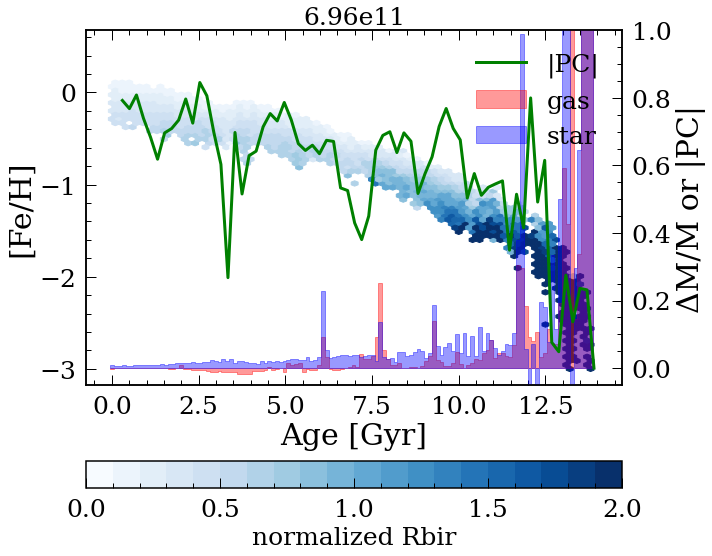

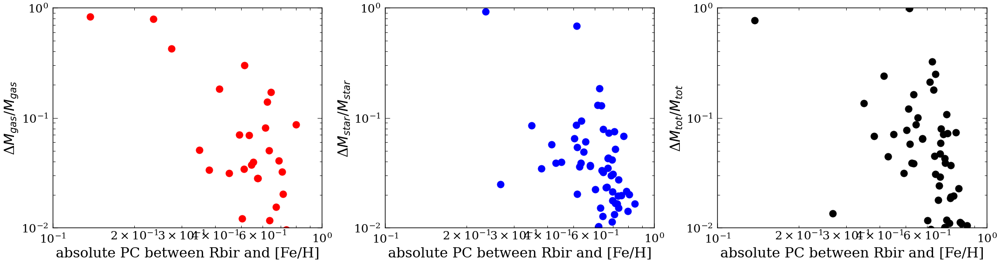

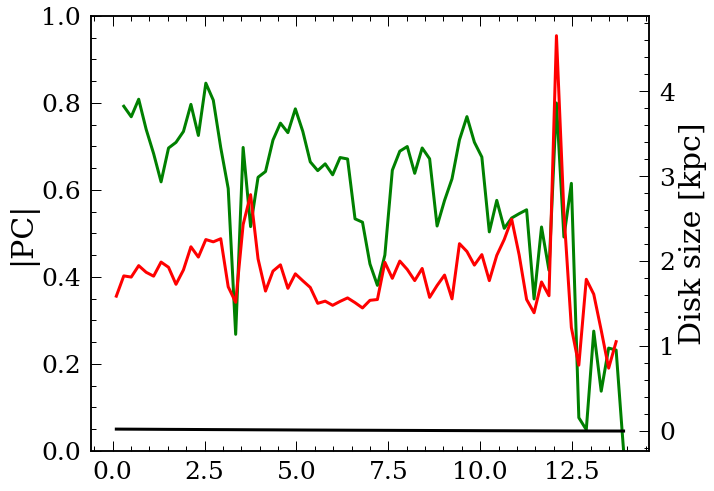

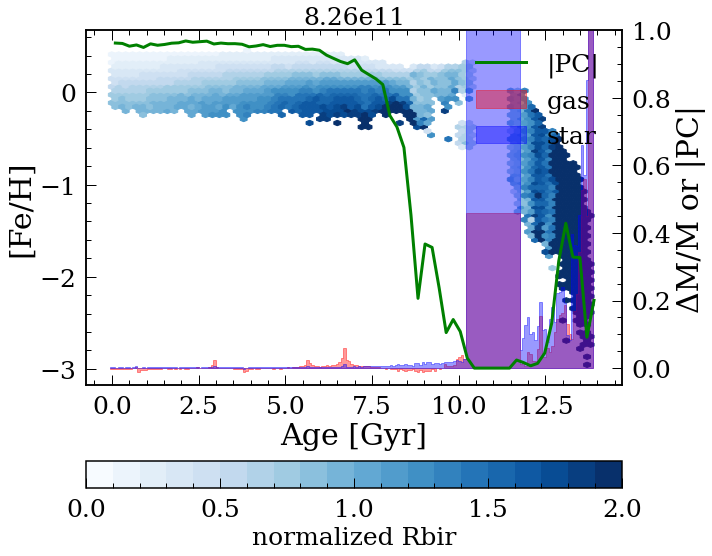

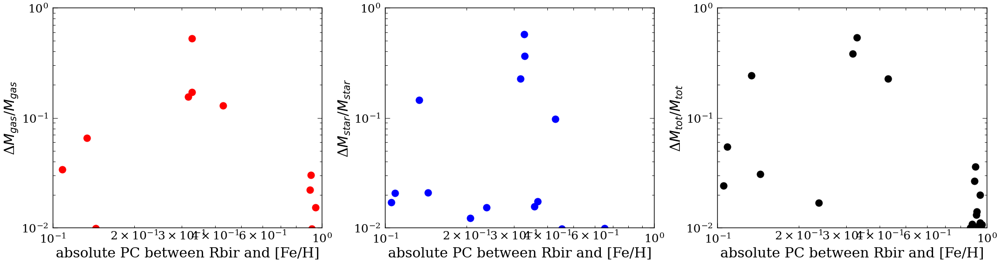

...

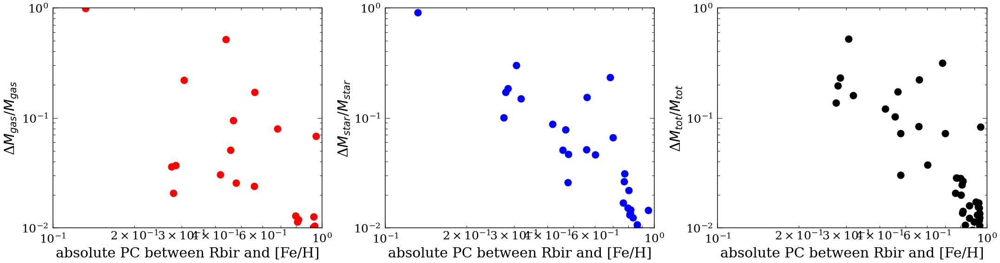

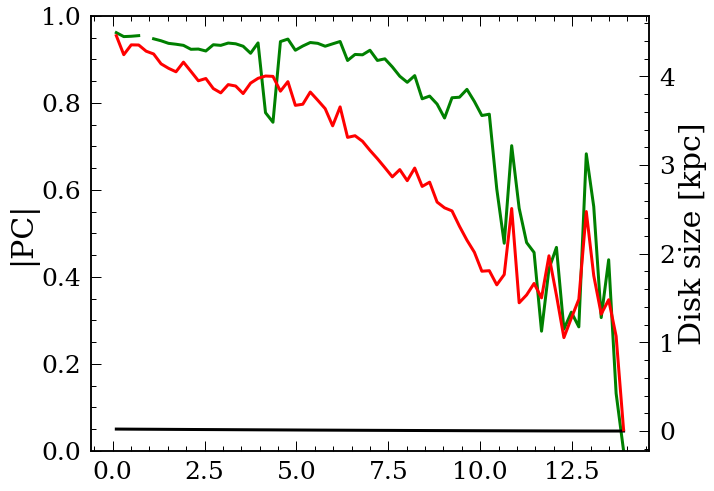

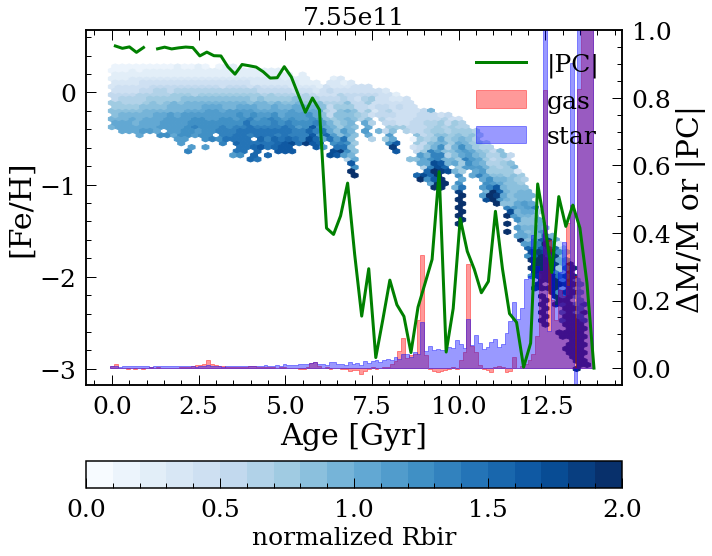

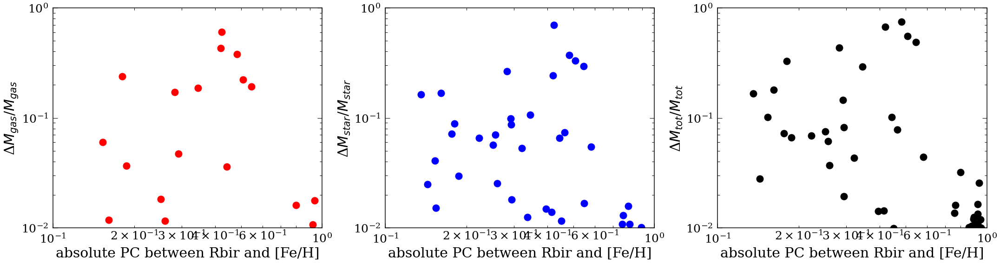

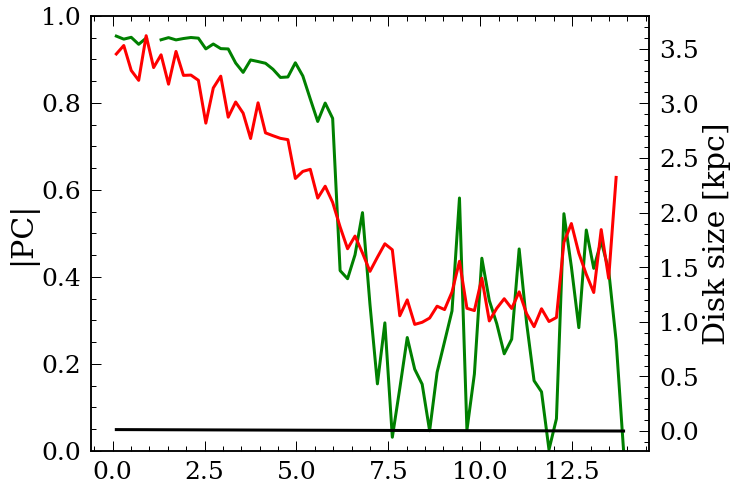

In [11]:
from scipy import stats
cmap = plt.cm.get_cmap('Blues',20)
for i in range(len(simsnames)):
    simNo = simsnames[i]
    Rcut=True
    Rcut_thread=30
    zcut_thread=2.5

    try:
        data = readsimdata(simNo,Rcut,Rcut_thread,zcut_thread,disk=True)
    except:
        continue
    
    
    
    name = ''
    
    for k in sims[i].split('_')[0].split('.'):
        name = name+k
    if name == '112e12':
        continue
        
    df = pd.read_pickle('ISM_slope_'+name+'.pkl')
    
        
    df = df.sort_values('time')
    df = df.dropna(subset=['masses','slope'])
    df['diffmass'] = np.append([0], np.diff(df['M_gas_hlr2'].values)/(df['M_gas_hlr2'].values[:-1]))
    df['diffmass_star'] = np.append([0], np.diff(df['M_star_hlr2'].values)/(df['M_star_hlr2'].values[:-1]))
    df['diffslope'] = np.append([0], np.diff(df['slope'].values))
    #print(name)
    
    # normalize R
    timereg = np.linspace(0,14,70)
    data = data.loc[data['Rbir']<1000]
    data = data.dropna().reset_index(drop=True)
    fehs = data['feh'].values
    rbirs = data['Rbir'].values
    allRs = data['Rbir'].values
    allages = data['age'].values
    disksize = np.zeros(69)
    disksize_std = np.zeros(69)
    pcs = np.zeros((69,2))

    slopetimes = 14.1-df['time']              
    for j in trange(70-1):
        m = (allages>timereg[j])&(allages<timereg[j+1])
        m2 = (slopetimes>timereg[j])&(slopetimes<timereg[j+1])                            
        disksize[j] = np.mean(df['half_mass_l2'][m2]/1000)
        disksize_std[j] = np.std(allRs[m])
        allRs[m] = allRs[m]/disksize[j]
        allRs[m] = allRs[m]
        if sum(m)<10:
            print('less than 10 stars')
            pcs[i,:] = [np.nan, np.nan]
            continue
        try:
            pcs[j,:] = stats.pearsonr(rbirs[m], fehs[m])
        except:
            print('there is NaNs')
        #print(pcs[j,:])
        
    #print(pcs)
    data['Rbir_norm'] = allRs
    
    print(np.mean(pd.Series(pcs[:,1]).dropna()))
    
    plt.figure(figsize=(10,8))
    plt.hexbin(data['age'], data['feh'], C=data['Rbir_norm'], extent=(0,14,-3,0.5),gridsize=70, mincnt=1, cmap=cmap, 
           vmin=0, vmax=2)
    
    np.save('age_'+name, data['age'].values)
    np.save('feh_'+name, data['feh'].values)
    np.save('normRbir_'+name, data['Rbir_norm'].values)
    
    plt.ylabel('[Fe/H]')
    plt.xlabel('Age [Gyr]')


    plt.twinx()
    plt.plot((timereg[:-1]+timereg[1:])/2, abs(pcs[:,0]), 'g-', linewidth=3, label='|PC|')
    
    np.save('pctime_'+name, (timereg[:-1]+timereg[1:])/2)
    np.save('pc_Rbir_'+name, pcs[:,0])
    
    plt.xlabel('Age [Gyr]')
    plt.ylim([0,1])

    plt.fill_between(14.1-df['time'], df['diffmass'], step="pre", alpha=0.4,label='gas',color='r')
    plt.fill_between(14.1-df['time'], df['diffmass_star'], step="pre", alpha=0.4,label='star', color='b')
    
    plt.ylim([-0.05,1])
    plt.ylabel('ΔM/M or |PC|')
    cbar = plt.colorbar(orientation='horizontal')
    car = cbar.set_label('normalized Rbir',fontsize = 25,labelpad = 5)

    plt.title(simNo, fontsize=25)
    plt.legend(loc=1)
    plt.tight_layout()

    plt.figure(figsize=(30,8))
    plt.subplot(1,3,1)
    diffgas = np.zeros(69)
    diffstar = np.zeros(69)
    difftot = np.zeros(69)
    df['diftot'] = df['diffmass_star']+df['diffmass']
    for k in range(70-1):
        m = (14.1-df['time']>timereg[k])&(14.1-df['time']<timereg[k+1])
        diffgas[k], diffstar[k], difftot[k] = np.median(pd.Series(df['diffmass'].values[m]).dropna()), np.median(pd.Series(df['diffmass_star'].values[m]).dropna()), np.median(pd.Series(df['diftot'].values[m]).dropna())
    pcabs, diffgas, diffstar, difftot, disksize_sort = np.array(abs(pcs[:,0])), np.array(diffgas), np.array(diffstar), np.array(difftot), np.array(disksize)
    
    #diffgas_s = gaussian_filter1d(diffgas, 20)
    #diffstar_s = gaussian_filter1d(diffstar, 20)
    #difftot_s = gaussian_filter1d(difftot, 20)
    plt.plot(pcabs, diffgas, 'ro', label='gas', markersize=15)
    #plt.plot(pcabs, diffgas_s, 'r-', label='gas', markersize=15)
    
    
    plt.ylim([1e-2,1])
    plt.xlim([1e-1,1])
    plt.xscale('log')
    plt.yscale('log')
    plt.xlabel('absolute PC between Rbir and [Fe/H]')
    plt.ylabel('Δ$M_{gas}$/$M_{gas}$')
    plt.tight_layout()


    plt.subplot(1,3,2)
    plt.plot(pcabs, diffstar, 'bo', label='star', markersize=15)
    #plt.plot(pcabs, diffstar_s, 'b-', label='star', markersize=15)
    plt.ylim([1e-2,1])
    plt.xlim([1e-1,1])
    plt.xscale('log')
    plt.yscale('log')
    plt.xlabel('absolute PC between Rbir and [Fe/H]')
    plt.ylabel('Δ$M_{star}$/$M_{star}$')
    plt.tight_layout()

    plt.subplot(1,3,3)
    plt.plot(pcabs, difftot, 'ko', label='total', markersize=15)
    #plt.plot(pcabs, difftot_s, 'k-', label='total', markersize=15)
    plt.ylim([1e-2,1])
    plt.xlim([1e-1,1])
    plt.xscale('log')
    plt.yscale('log')
    plt.xlabel('absolute PC between Rbir and [Fe/H]')
    plt.ylabel('Δ$M_{tot}$/$M_{tot}$')
    plt.tight_layout()

    np.save('pc_bintime_'+name, pcabs)
    np.save('diffgas_Rbir_'+name, diffgas)
    np.save('diffstar_Rbir_'+name, diffstar)
    np.save('disksize_sort_'+name, disksize_sort)
    #np.save('difftot_'+name, difftot)
    #np.save('disksize_'+name, disksize)
    
    plt.figure(figsize=(10,8))
    plt.plot((timereg[:-1]+timereg[1:])/2, abs(pcs[:,0]), 'g-',linewidth=3, label='|PC|')
    plt.ylabel('|PC|')
    plt.ylim([0,1])
    plt.twinx()
    plt.plot((timereg[:-1]+timereg[1:])/2, disksize/1000, 'k-',linewidth=3, label='disk size')
    plt.plot((timereg[:-1]+timereg[1:])/2, disksize_std, 'r-',linewidth=3, label='std Rbir')
    plt.ylabel('Disk size [kpc]')
    #plt.ylim([0,1])
    plt.xlabel('Age [Gyr]')





 99%|█████████▊| 68/69 [01:08<00:00,  1.00it/s]/data/shared_data/anaconda3/lib/python3.9/site-packages/numpy/core/_methods.py:261: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/data/shared_data/anaconda3/lib/python3.9/site-packages/numpy/core/_methods.py:221: RuntimeWarning: invalid value encountered in true_divide
  arrmean = um.true_divide(arrmean, div, out=arrmean, casting='unsafe',
/data/shared_data/anaconda3/lib/python3.9/site-packages/numpy/core/_methods.py:253: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
100%|██████████| 69/69 [01:09<00:00,  1.01s/it]

less than 10 stars
0.08130127708536694



/tmp/ipykernel_3466881/1770539658.py:94: MatplotlibDeprecationWarning: Starting from Matplotlib 3.6, colorbar() will steal space from the mappable's axes, rather than from the current axes, to place the colorbar.  To silence this warning, explicitly pass the 'ax' argument to colorbar().
  cbar = plt.colorbar(orientation='horizontal')
 75%|███████▌  | 52/69 [01:49<00:35,  2.11s/it]

there is NaNs


 77%|███████▋  | 53/69 [01:52<00:33,  2.10s/it]

there is NaNs


 78%|███████▊  | 54/69 [01:54<00:31,  2.10s/it]

there is NaNs


 80%|███████▉  | 55/69 [01:56<00:29,  2.09s/it]

there is NaNs


 81%|████████  | 56/69 [01:58<00:27,  2.09s/it]

there is NaNs


 83%|████████▎ | 57/69 [02:00<00:24,  2.08s/it]

there is NaNs


100%|██████████| 69/69 [02:25<00:00,  2.11s/it]


0.01676591463501054


/tmp/ipykernel_3466881/1770539658.py:94: MatplotlibDeprecationWarning: Starting from Matplotlib 3.6, colorbar() will steal space from the mappable's axes, rather than from the current axes, to place the colorbar.  To silence this warning, explicitly pass the 'ax' argument to colorbar().
  cbar = plt.colorbar(orientation='horizontal')
/data/shared_data/anaconda3/lib/python3.9/site-packages/numpy/core/fromnumeric.py:3419: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/data/shared_data/anaconda3/lib/python3.9/site-packages/numpy/core/_methods.py:188: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
 99%|█████████▊| 68/69 [03:00<00:02,  2.81s/it]/data/shared_data/anaconda3/lib/python3.9/site-packages/numpy/core/_methods.py:261: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/data/shared_data/anaconda3/lib/python3.9/site-packages/numpy/core

less than 10 stars
0.02094807713466064



/tmp/ipykernel_3466881/1770539658.py:94: MatplotlibDeprecationWarning: Starting from Matplotlib 3.6, colorbar() will steal space from the mappable's axes, rather than from the current axes, to place the colorbar.  To silence this warning, explicitly pass the 'ax' argument to colorbar().
  cbar = plt.colorbar(orientation='horizontal')
100%|██████████| 69/69 [06:04<00:00,  5.29s/it]

less than 10 stars
0.027831839957539156



/tmp/ipykernel_3466881/1770539658.py:94: MatplotlibDeprecationWarning: Starting from Matplotlib 3.6, colorbar() will steal space from the mappable's axes, rather than from the current axes, to place the colorbar.  To silence this warning, explicitly pass the 'ax' argument to colorbar().
  cbar = plt.colorbar(orientation='horizontal')
 99%|█████████▊| 68/69 [02:43<00:02,  2.34s/it]/data/shared_data/anaconda3/lib/python3.9/site-packages/numpy/core/_methods.py:261: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/data/shared_data/anaconda3/lib/python3.9/site-packages/numpy/core/_methods.py:221: RuntimeWarning: invalid value encountered in true_divide
  arrmean = um.true_divide(arrmean, div, out=arrmean, casting='unsafe',
/data/shared_data/anaconda3/lib/python3.9/site-packages/numpy/core/_methods.py:253: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
100%|██████████| 69/69 [02:4

less than 10 stars
0.039514528901612125



/tmp/ipykernel_3466881/1770539658.py:94: MatplotlibDeprecationWarning: Starting from Matplotlib 3.6, colorbar() will steal space from the mappable's axes, rather than from the current axes, to place the colorbar.  To silence this warning, explicitly pass the 'ax' argument to colorbar().
  cbar = plt.colorbar(orientation='horizontal')


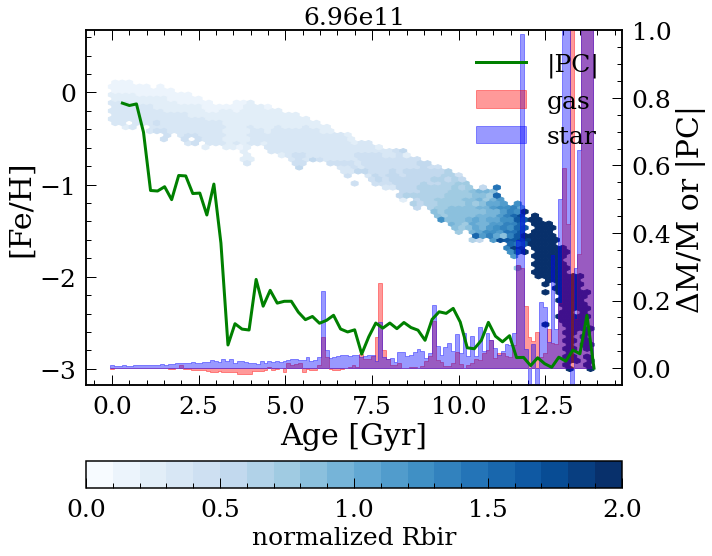

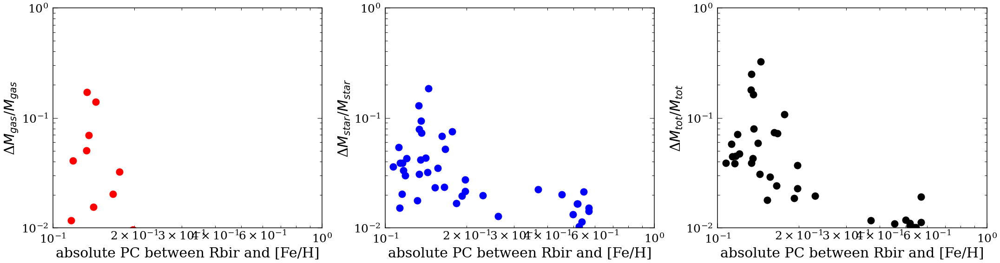

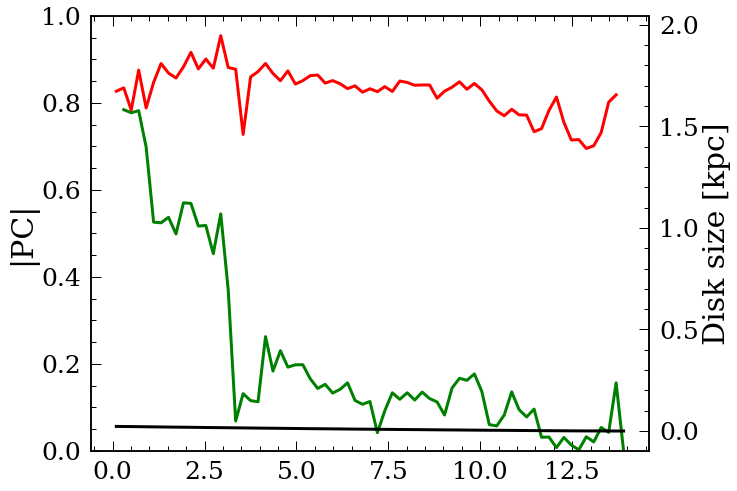

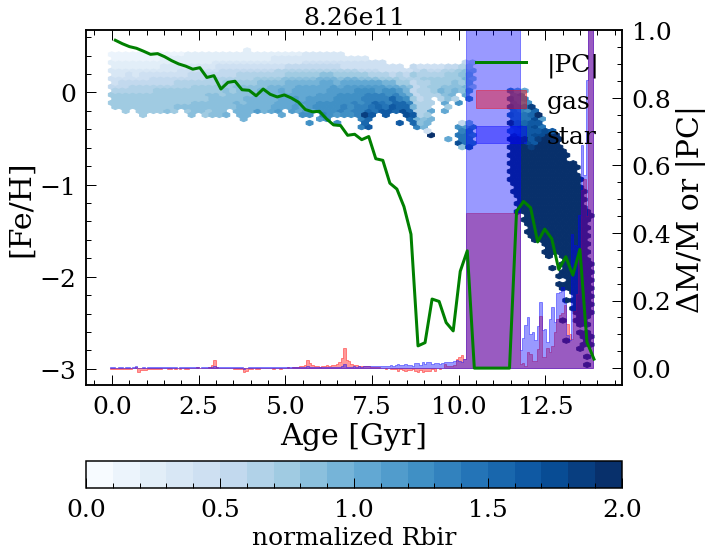

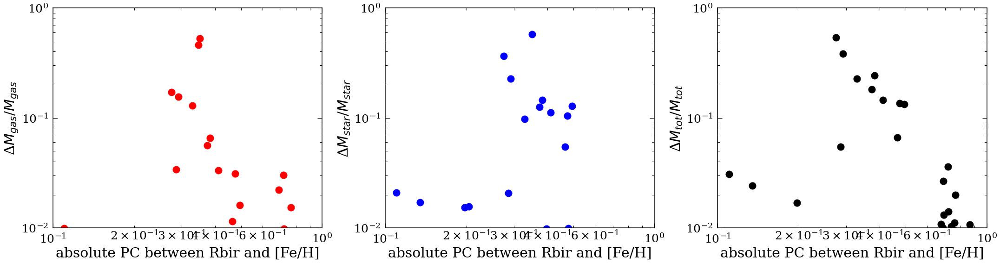

...

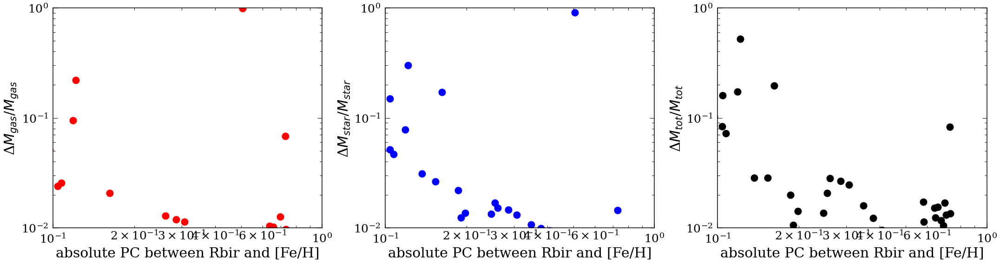

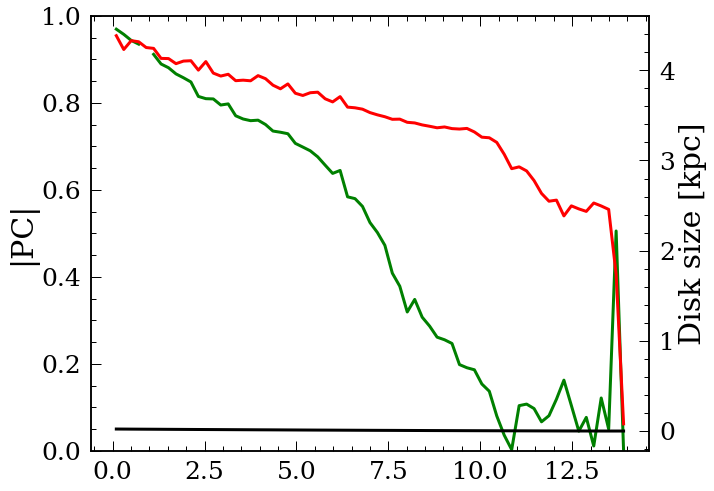

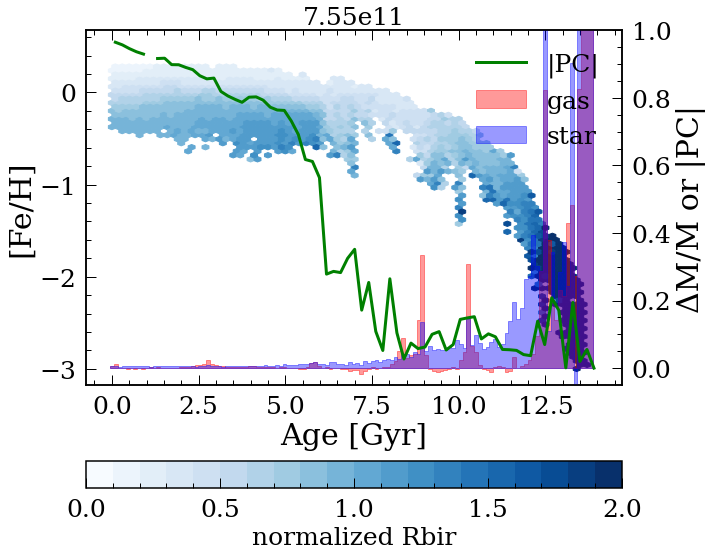

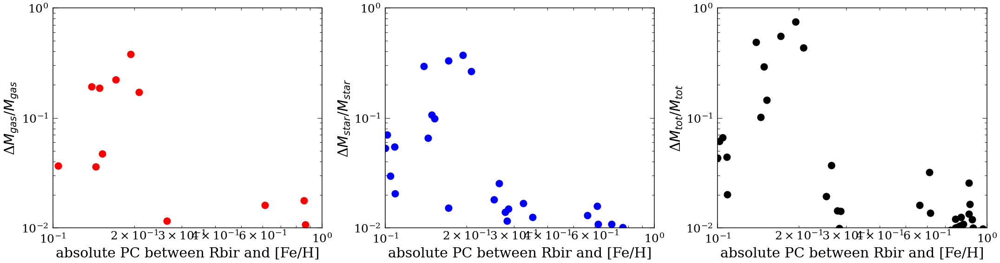

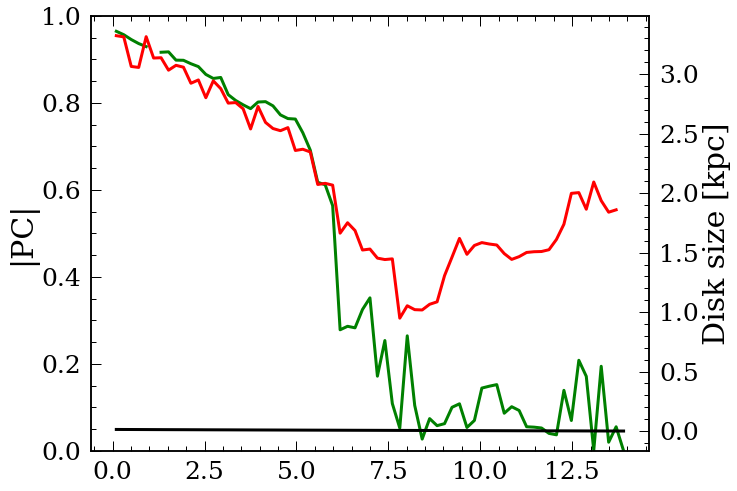

In [12]:
from scipy import stats
cmap = plt.cm.get_cmap('Blues',20)
for i in range(len(simsnames)):
    simNo = simsnames[i]
    Rcut=True
    Rcut_thread=30
    zcut_thread=2.5

    try:
        data = readsimdata(simNo,Rcut,Rcut_thread,zcut_thread,disk=True)
    except:
        continue
    
    
    
    name = ''
    
    for k in sims[i].split('_')[0].split('.'):
        name = name+k
    if name == '112e12':
        continue
        
    df = pd.read_pickle('ISM_slope_'+name+'.pkl')
    
        
    df = df.sort_values('time')
    df = df.dropna(subset=['masses','slope'])
    df['diffmass'] = np.append([0], np.diff(df['M_gas_hlr2'].values)/(df['M_gas_hlr2'].values[:-1]))
    df['diffmass_star'] = np.append([0], np.diff(df['M_star_hlr2'].values)/(df['M_star_hlr2'].values[:-1]))
    df['diffslope'] = np.append([0], np.diff(df['slope'].values))
    #print(name)
    
    # normalize R
    timereg = np.linspace(0,14,70)
    data = data.loc[data['Rg']<1000]
    data = data.dropna().reset_index(drop=True)
    fehs = data['feh'].values
    rbirs = data['Rg'].values
    allRs = data['Rg'].values
    allages = data['age'].values
    disksize = np.zeros(69)
    disksize_std = np.zeros(69)
    pcs = np.zeros((69,2))

    slopetimes = 14.1-df['time']              
    for j in trange(70-1):
        m = (allages>timereg[j])&(allages<timereg[j+1])
        m2 = (slopetimes>timereg[j])&(slopetimes<timereg[j+1])                            
        disksize[j] = np.mean(df['half_mass_l2'][m2]/1000)
        disksize_std[j] = np.std(allRs[m])
        allRs[m] = allRs[m]/disksize[j]
        allRs[m] = allRs[m]
        if sum(m)<10:
            print('less than 10 stars')
            pcs[i,:] = [np.nan, np.nan]
            continue
        try:
            pcs[j,:] = stats.pearsonr(rbirs[m], fehs[m])
        except:
            print('there is NaNs')
        #print(pcs[j,:])
        
    #print(pcs)
    data['Rg_norm'] = allRs
    
    print(np.mean(pd.Series(pcs[:,1]).dropna()))
    
    plt.figure(figsize=(10,8))
    plt.hexbin(data['age'], data['feh'], C=data['Rg_norm'], extent=(0,14,-3,0.5),gridsize=70, mincnt=1, cmap=cmap, 
           vmin=0, vmax=2)
    
    #np.save('age_'+name, data['age'].values)
    #np.save('feh_'+name, data['feh'].values)
    np.save('normRg_'+name, data['Rg_norm'].values)
    
    plt.ylabel('[Fe/H]')
    plt.xlabel('Age [Gyr]')


    plt.twinx()
    plt.plot((timereg[:-1]+timereg[1:])/2, abs(pcs[:,0]), 'g-', linewidth=3, label='|PC|')
    
    np.save('pctime_'+name, (timereg[:-1]+timereg[1:])/2)
    np.save('pc_'+name, pcs[:,0])
    
    plt.xlabel('Age [Gyr]')
    plt.ylim([0,1])

    plt.fill_between(14.1-df['time'], df['diffmass'], step="pre", alpha=0.4,label='gas',color='r')
    plt.fill_between(14.1-df['time'], df['diffmass_star'], step="pre", alpha=0.4,label='star', color='b')
    
    plt.ylim([-0.05,1])
    plt.ylabel('ΔM/M or |PC|')
    cbar = plt.colorbar(orientation='horizontal')
    car = cbar.set_label('normalized Rbir',fontsize = 25,labelpad = 5)

    plt.title(simNo, fontsize=25)
    plt.legend(loc=1)
    plt.tight_layout()

    plt.figure(figsize=(30,8))
    plt.subplot(1,3,1)
    diffgas = np.zeros(69)
    diffstar = np.zeros(69)
    difftot = np.zeros(69)
    df['diftot'] = df['diffmass_star']+df['diffmass']
    for k in range(70-1):
        m = (14.1-df['time']>timereg[k])&(14.1-df['time']<timereg[k+1])
        diffgas[k], diffstar[k], difftot[k] = np.median(pd.Series(df['diffmass'][m]).dropna()), np.median(pd.Series(df['diffmass_star'][m]).dropna()), np.median(pd.Series(df['diftot'][m]).dropna())
    pcabs, diffgas, diffstar, difftot, disksize_sort = np.array(abs(pcs[:,0])), np.array(diffgas), np.array(diffstar), np.array(difftot), np.array(disksize)
    plt.plot(pcabs, diffgas, 'ro', label='gas', markersize=15)
    #plt.plot(pcabs, diffgas_s, 'r-', label='gas', markersize=15)
    
    
    plt.ylim([1e-2,1])
    plt.xlim([1e-1,1])
    plt.xscale('log')
    plt.yscale('log')
    plt.xlabel('absolute PC between Rbir and [Fe/H]')
    plt.ylabel('Δ$M_{gas}$/$M_{gas}$')
    plt.tight_layout()


    plt.subplot(1,3,2)
    plt.plot(pcabs, diffstar, 'bo', label='star', markersize=15)
    #plt.plot(pcabs, diffstar_s, 'b-', label='star', markersize=15)
    plt.ylim([1e-2,1])
    plt.xlim([1e-1,1])
    plt.xscale('log')
    plt.yscale('log')
    plt.xlabel('absolute PC between Rbir and [Fe/H]')
    plt.ylabel('Δ$M_{star}$/$M_{star}$')
    plt.tight_layout()

    plt.subplot(1,3,3)
    plt.plot(pcabs, difftot, 'ko', label='total', markersize=15)
    #plt.plot(pcabs, difftot_s, 'k-', label='total', markersize=15)
    plt.ylim([1e-2,1])
    plt.xlim([1e-1,1])
    plt.xscale('log')
    plt.yscale('log')
    plt.xlabel('absolute PC between Rbir and [Fe/H]')
    plt.ylabel('Δ$M_{tot}$/$M_{tot}$')
    plt.tight_layout()

    np.save('pc_bintime_Rg_'+name, pcabs)
    np.save('diffgas_'+name, diffgas)
    np.save('diffstar_'+name, diffstar)
    np.save('disksize_sort_Rg'+name, disksize_sort)
    #np.save('difftot_'+name, difftot)
    #np.save('disksize_'+name, disksize)
    
    plt.figure(figsize=(10,8))
    plt.plot((timereg[:-1]+timereg[1:])/2, abs(pcs[:,0]), 'g-',linewidth=3, label='|PC|')
    plt.ylabel('|PC|')
    plt.ylim([0,1])
    plt.twinx()
    plt.plot((timereg[:-1]+timereg[1:])/2, disksize/1000, 'k-',linewidth=3, label='disk size')
    plt.plot((timereg[:-1]+timereg[1:])/2, disksize_std, 'r-',linewidth=3, label='std Rbir')
    plt.ylabel('Disk size [kpc]')
    #plt.ylim([0,1])
    plt.xlabel('Age [Gyr]')






In [13]:
name

'g755e11'

/tmp/ipykernel_3350811/3650874003.py:77: MatplotlibDeprecationWarning: Starting from Matplotlib 3.6, colorbar() will steal space from the mappable's axes, rather than from the current axes, to place the colorbar.  To silence this warning, explicitly pass the 'ax' argument to colorbar().
  cbar = plt.colorbar(orientation='horizontal')


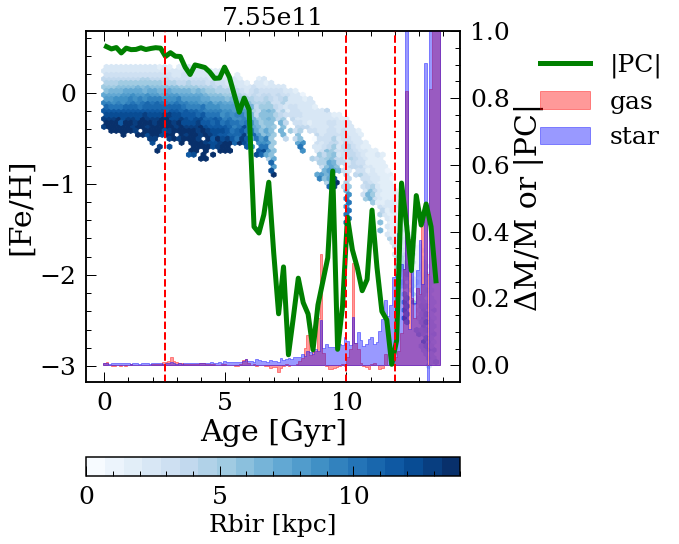

In [332]:
i=5
simNo = '7.55e11'
Rcut=True
Rcut_thread=30
zcut_thread=2.5


data = readsimdata(simNo,Rcut,Rcut_thread,zcut_thread,disk=True)




name = ''

for k in sims[i].split('_')[0].split('.'):
    name = name+k
    

df = pd.read_pickle('ISM_slope_'+name+'.pkl')


df = df.sort_values('time')
df = df.dropna(subset=['masses','slope'])
#df['masses'] = gaussian_filter1d(df['masses'], 2)
#df['slope'] = gaussian_filter1d(df['slope'], 2)
df = df.dropna().reset_index(drop=True)
df['diffmass'] = np.append([0], np.diff(df['M_gas'].values)/df['M_gas'].values[:-1])
df['diffmass_star'] = np.append([0], np.diff(df['M_star'].values)/df['M_star'].values[:-1])
df['diffslope'] = np.append([0], np.diff(df['slope'].values))
#print(name)

'''
# normalize R
timereg = np.linspace(0,14,70)
fehs = data['feh'].values
rbirs = data['Rbir'].values
allages = data['age'].values
pcs = np.zeros((69,2))
for i in trange(70-1):
    m = (allages>timereg[i])&(allages<timereg[i+1])
    if sum(m)<10:
        pcs[i,:] = [np.nan, np.nan]
        continue
    pcs[i,:] = stats.pearsonr(rbirs[m], fehs[m])
print(np.mean(pd.Series(pcs[:,1]).dropna()))
'''
plt.figure(figsize=(12,8))
plt.hexbin(data['age'], data['feh'], C=data['Rbir'], extent=(0,14,-3,0.5),gridsize=70, mincnt=1,
       vmin=0, vmax=14, cmap = plt.cm.get_cmap('Blues',20))
plt.ylabel('[Fe/H]')
plt.xlabel('Age [Gyr]')


plt.twinx()
"""
data_merg = readsimdata(simNo,False,Rcut_thread,zcut_thread,disk=False)
plt.plot(data_merg['age'],data_merg['Rbir'],'r.',label='mergers', markersize=1)
plt.ylabel('Rbir [kpc]')

plt.plot((timereg[:-1]+timereg[1:])/2, abs(pcs[:,0])*300, 'g-', linewidth=3, label='|PC|')
plt.ylim([0,300])
"""
plt.plot((timereg[:-1]+timereg[1:])/2, abs(pcs[:,0]), 'g-', linewidth=5, label='|PC|')
plt.xlabel('Age [Gyr]')
plt.ylim([0,1])

plt.fill_between(14.1-df['time'], df['diffmass'], step="pre", alpha=0.4,label='gas',color='r')
plt.fill_between(14.1-df['time'], df['diffmass_star'], step="pre", alpha=0.4,label='star', color='b')
#plt.plot(14.1-df['time'],df['diffmass'],'r-',label='gas')
#plt.plot(14.1-df['time'],df['diffmass_star'],'b-',label='star')
#plt.plot(14.1-df['time'],df['diffmass_star']+df['diffmass'],'k-',label='gas+star')
plt.plot([2.5, 2.5], [-0.05,2], 'r--')
plt.plot([10, 10], [-0.05,2], 'r--')
plt.plot([12, 12], [-0.05,2], 'r--')
plt.ylim([-0.05,1])
plt.ylabel('ΔM/M or |PC|')
cbar = plt.colorbar(orientation='horizontal')
car = cbar.set_label('Rbir [kpc]',fontsize = 25,labelpad = 5)

plt.title(simNo, fontsize=25)
plt.legend(bbox_to_anchor=(1.6,1))
plt.tight_layout()
    

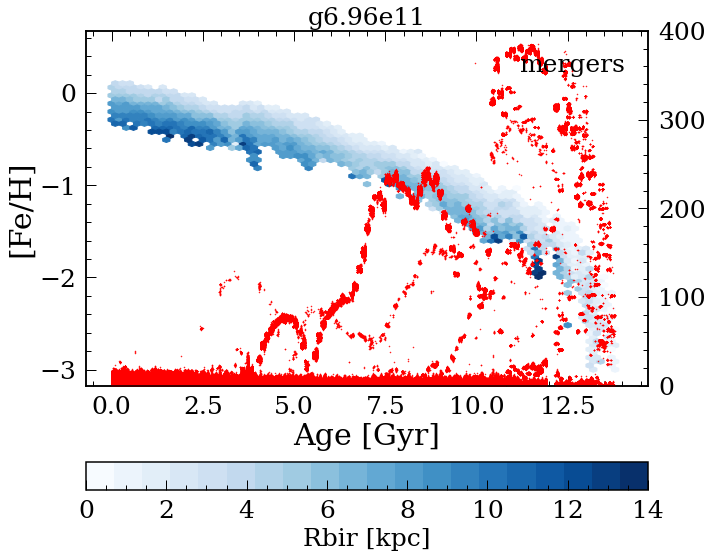

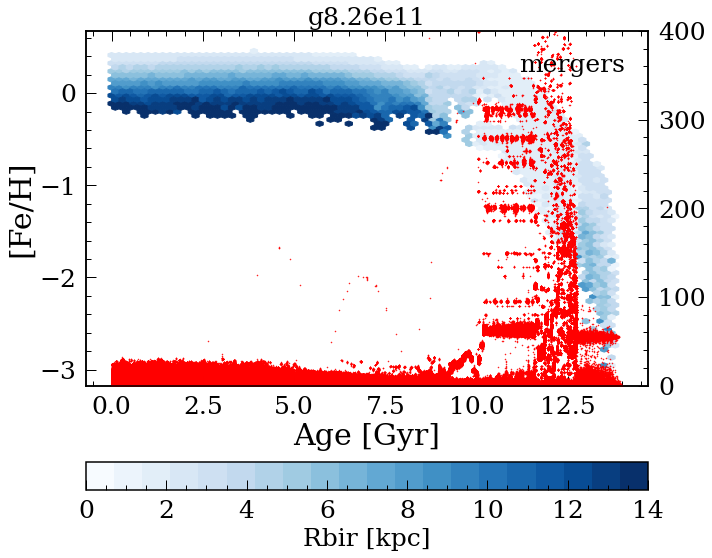

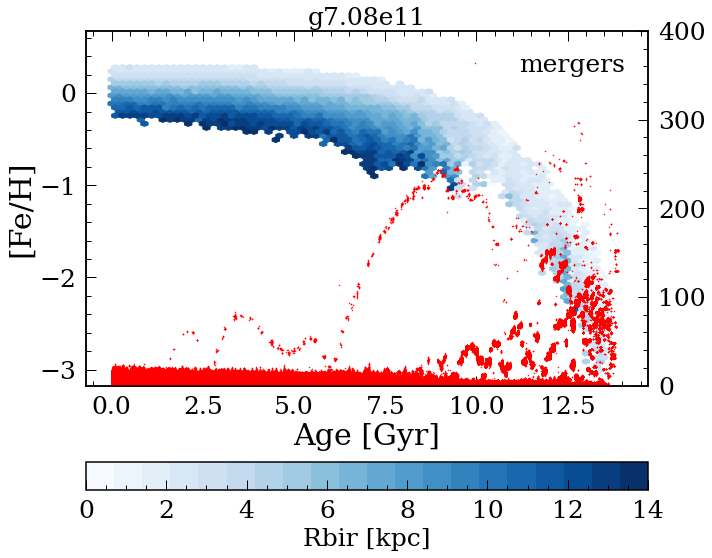

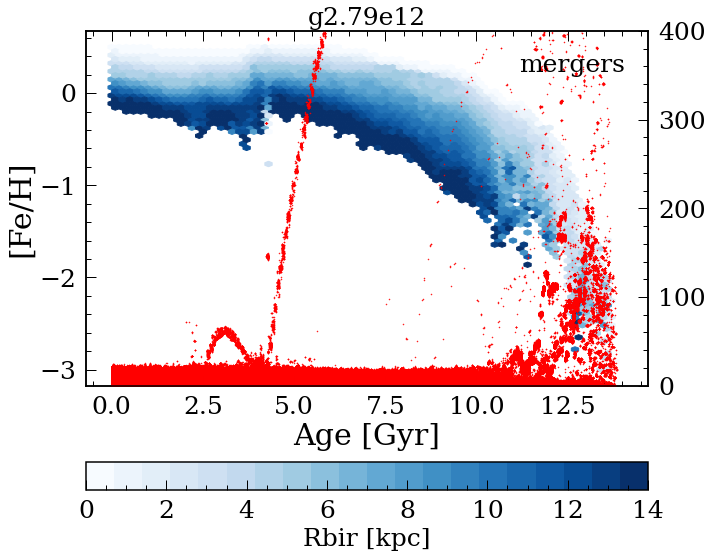

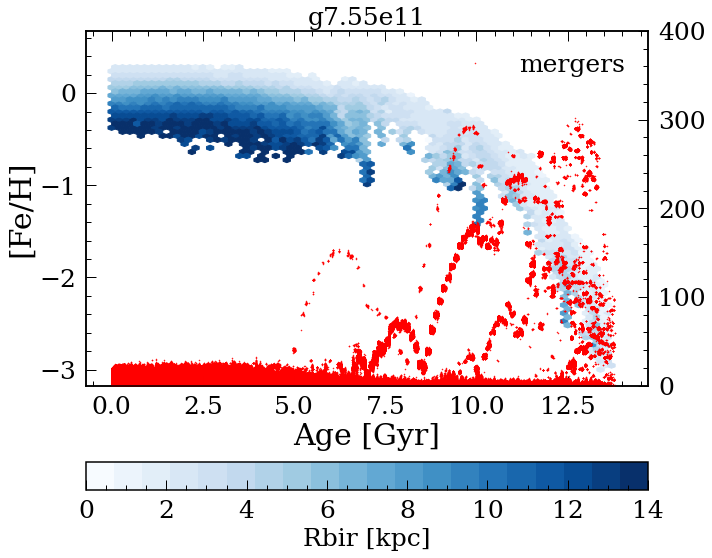

In [120]:
for i, simNo in enumerate(simsnames):
    Rcut=False
    Rcut_thread=30
    zcut_thread=2.5

    try:
        data = readsimdata(simNo,Rcut,Rcut_thread,zcut_thread,disk=True)
    except:
        continue
    
    name = ''
    
    for k in sims[i].split('_')[0].split('.'):
        name = name+k
    if name == 'g112e12':
        continue
        
    
    plt.figure(figsize=(10,8))
    plt.hexbin(data['age'], data['feh'], C=data['Rbir'], extent=(0,14,-3,0.5),gridsize=70, mincnt=1, cmap=cmap, 
               vmin=0, vmax=14)
    plt.ylabel('[Fe/H]')
    plt.xlabel('Age [Gyr]')
    cbar = plt.colorbar(orientation='horizontal')
    car = cbar.set_label('Rbir [kpc]',fontsize = 25,labelpad = 5)

    data = readsimdata(simNo,Rcut,Rcut_thread,zcut_thread,disk=False)
    plt.twinx()
    plt.plot(data['age'],data['Rbir'],'r.',label='mergers', markersize=1)
    if simNo=='2.79e11':
        plt.ylim([0,1000])
    else:
        plt.ylim([0,400])
    
    plt.title('g'+simNo, fontsize=25)
    plt.legend(loc=1)
    plt.tight_layout()





In [81]:
scatters = pd.read_pickle('scatters_qua_dage.pkl')
#scatters = pd.read_pickle('scatters_qua.pkl')

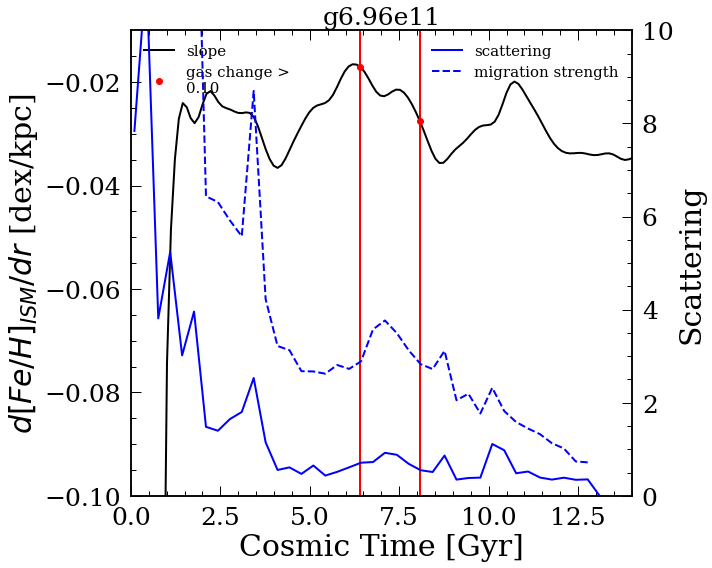

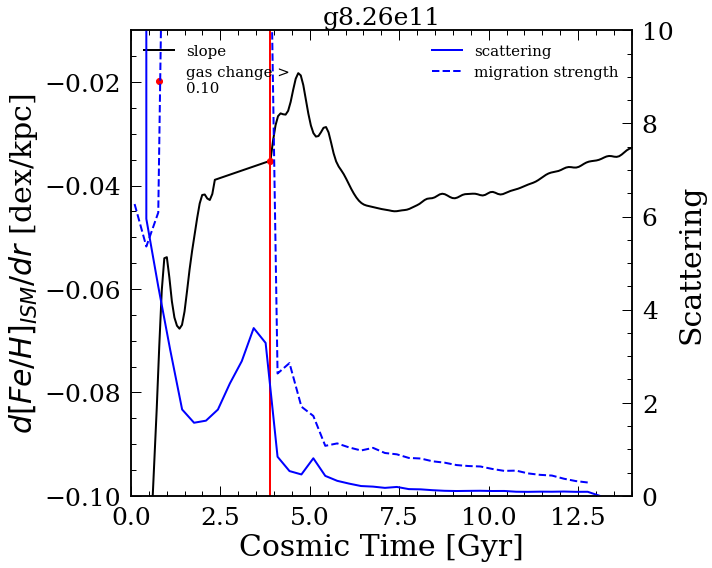

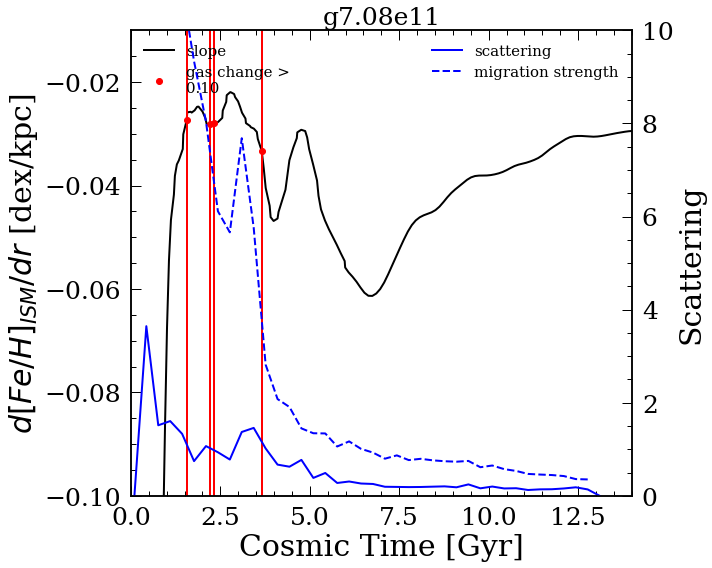

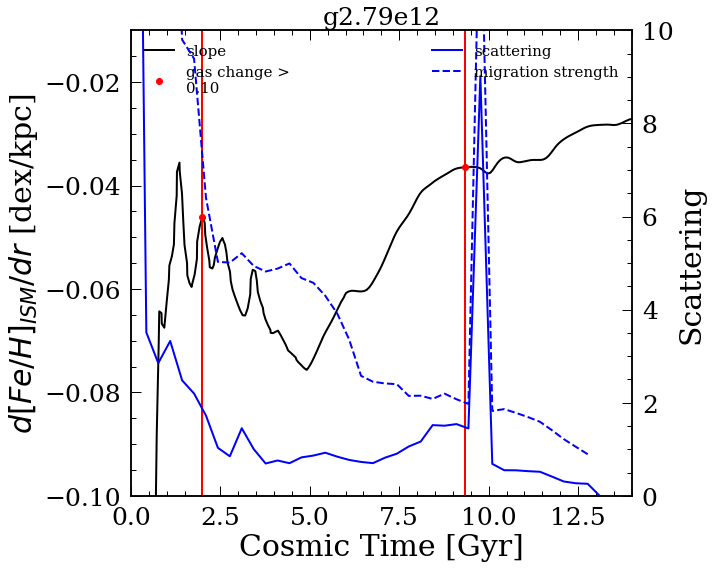

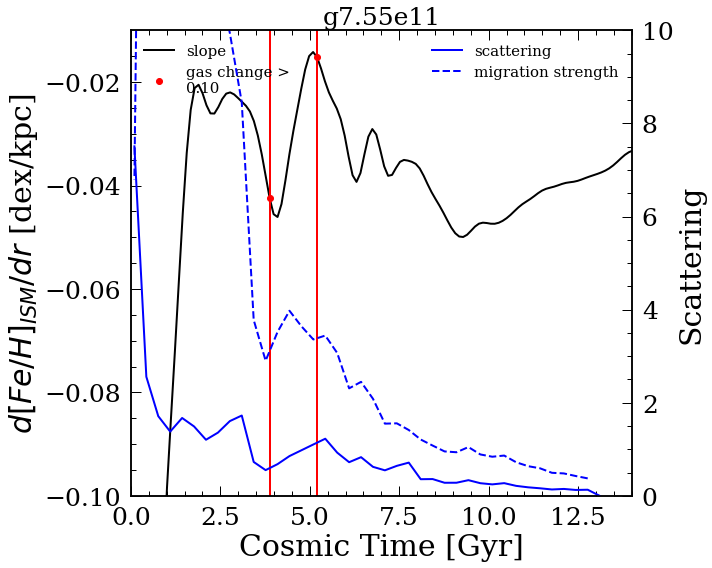

In [85]:
cutlim = 0.1
for i, simNo in enumerate(simsnames):
    Rcut=True
    Rcut_thread=30
    zcut_thread=2.5

    name = ''
    
    for k in sims[i].split('_')[0].split('.'):
        name = name+k
    if name == 'g112e12':
        continue
        
    df = pd.read_pickle('ISM_slope_'+name+'.pkl')
    #m=df['time']>5
    #df = df[m].reset_index(drop=True)
    df = df.sort_values('time')
    df = df.dropna(subset=['masses','slope'])
    df['masses'] = gaussian_filter1d(df['masses'], 2)
    df['slope'] = gaussian_filter1d(df['slope'], 2)
    df['diffmass'] = np.append([0], np.diff(df['M_gas'].values)/np.median(df['M_gas'].values))
    df['diffmass_star'] = np.append([0], np.diff(df['M_star'].values)/np.median(df['M_star'].values))
    df['diffslope'] = np.append([0], np.diff(df['slope'].values))
    #print(name)
    
    plt.figure(figsize=(10,8))
    plt.plot(df['time'], df['slope'],'k-',label='slope')
    
    m = df['diffmass']>cutlim
    plt.plot(df['time'][m], df['slope'][m],'ro',label='gas change >\n%.2f'%(cutlim))
    for jjj in range(sum(m)):
        plt.plot([df['time'][m].values[jjj],df['time'][m].values[jjj]], 
                 [-0.1,0.01],'r-')
    plt.xlabel('Cosmic Time [Gyr]')
    plt.ylabel('$d[Fe/H]_{ISM}/dr$ [dex/kpc]')
    plt.title('g'+simNo, fontsize=25)
    plt.ylim([-0.1,-0.01])
    plt.xlim([0,14])
    plt.legend(loc=2,fontsize=15)
    
    plt.twinx()
    plt.plot(scatters['times'], scatters[simsnames[i]], 'b-', label='scattering')
    plt.plot(scatters['times'], scatters[simsnames[i]+'_rm'],'b--',label='migration strength')
    plt.ylim([0,10])
    plt.xlim([0,14])
    plt.ylabel('Scattering')
    plt.legend(loc=1,fontsize=15)
    plt.tight_layout()





In [86]:
pwd

'/data/users/llu'